# Exploring Company Earnings Calls Before and After COVID-19


```
Author: Nicholas Keeley (ngk3pf@virginia.edu)
Course: DS 5001
Date: 15 March 2022
```


## References

1. Webscraping: https://www.hwanghwang.com/scraping-mf
2. General queries: www.stackoverflow.com
3. Methods, classes, and approaches: M1-10 HW notebooks (both personal copies and Dr. Alvarado's originals)

## Notes

The first section of this notebook is dedicated to webscraping code. Please skip to Section II for table generation and text analytics. 

Following are the the appropriate indices for the data files (e.g. BOW.csv) that you can find at https://virginia.box.com/s/kp22cn73zmhp90non1btxrcd2fjk4f2p. Please note that in certain sections, these base tables are manipulated for deeper analysis (e.g. dividing CORPUS into by-year CORPUS datasets):

In [795]:
#### Index Setting Guidelines ####

## Standard tables

# CORPUS.csv # set_index(["earning_id","section_num","sent_num","token_num"])
# LIB.csv # set_index("earnings_id")
# BOW.csv # set_index(["earnings_id","term_str"])
# VOCAB.csv # set_index("term_str")

## Sentiment analysis tables - COMBO, SA_YEAR_DOCS, SAMPLED_YEAR_DOCS, INDUSTRIES

# COMBO.csv # set_index(["earnings_id","section_num","sent_num","token_num"])
# SA_YEAR_DOCS.csv # set_index("ticker")
# SAMPLED_YEAR_DOCS.csv # set_index("ticker")
# INDUSTRIES.csv # set_index(["sector","year"])

## Word2vec/tsne table

# COORDS.csv #set_index("term_str")

## Topic Model tables

# TOPIC_YEAR.csv # set_index("year")
# TOPIC_SECTOR.csv # set_index("sector")
# TOPIC_TICKER.csv # set_index("ticker")

## PCA tables

# DCM.csv # set_index("earnings_id")
# DOCS # set_index("earnings_id")

## Clustering tables

# PAIRS.csv # set_index(["earning_a","earning_b"])

## Table of Contents

Section I: Webscraping

Section II: Create LIB table and full dataset

Section III: Create CORPUS table

Section IV: Create VOCAB table

Section V: BOW table creation, table annotation, and preparatory text analysis

Section VI: Hierarchical clustering

Section VII: Principal Components Analysis (PCA)

Section VIII: Topic modeling

Section IX: Word2vec

Section X: Sentiment analysis

Section XI: Export final data tables

## Imports

In [ ]:
#!pip install pandas_datareader

In [2]:
## Imports

import sys
from bs4 import BeautifulSoup
from datetime import datetime
import requests
import pandas as pd
import numpy as np
import re
from tqdm import tqdm
import plotly_express as px
import random
import scipy as sp
import yfinance as yf

In [265]:
from pathlib import Path
#import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
import gensim
from wordcloud import WordCloud
import matplotlib.pyplot as plt
#from pandas_datareader import data as pdr
from datetime import timedelta
import nltk
from gensim.models import word2vec
from sklearn.manifold import TSNE

%matplotlib inline

# I. Webscraping -- Only run if need more data! --

In [737]:
## Lists

callParticipantsList = []
earnings_text=[]
companyNameList = []
tickerList = []
dateList = []
timeList=[]
quarterList=[]
toc=[] #table of contents
sources=[]
years=[]
all_contents=[]


In [450]:
%%time
listofurls = []
newlistofurls = []

## Loop through all Motley Fool earnings call transcript pages

last_page=1760 # had to check manually

for i in range(last_page):
    url = 'https://www.fool.com/earnings-call-transcripts/?page='+str(i)
    response = requests.get(url)
    page = response.text
    soup = BeautifulSoup(page, "lxml")
    
    for a in soup.find(class_="content-block listed-articles recent-articles m-np").find_all('a', href=True):
        listofurls.append('https://www.fool.com'+str(a['href']))

    # Removed. Didn't understand why included.        
 
    #for x in range(0,len(listofurls),2):
      #  newlistofurls.append(listofurls[x])


CPU times: user 2min 52s, sys: 3.44 s, total: 2min 56s
Wall time: 20min 46s


In [559]:
## Edge case: do not delete

edge_case = "https://www.fool.com/earnings/call-transcripts/2022/02/03/onewater-marine-inc-onew-qearnings-call-transcript/"

In [720]:
len(listofurls)

35200

In [721]:
def extract_name(soup):
    
    check=None
    
    ## See if out of range/article content doesn't exist. Default = it doesn't
    
    try:
        check=soup.find(class_='tailwind-article-body').find_all('p')[1].find('strong')
    except:
        pass
    
    ## Save desired text
    
    if check == None:
        companyName=""
    else:
        companyName = soup.find(class_='tailwind-article-body').find_all('p')[1].find('strong').text
    #for x in companyName:
    companyNameList.append(companyName)
    return

In [722]:
def extract_ticker(soup):
    
    check=None
    
    ## Extract ticker
    
    check=soup.find(class_='tailwind-article-body').find_all('p')[1].find(class_='ticker-symbol')
    if check == None:
        ticker=""
    else:
        ticker = soup.find(class_='tailwind-article-body').find_all('p')[1].find(class_='ticker-symbol').text.replace(')',"").replace('(',"")
    #for x in ticker:
    tickerList.append(ticker)
    
    return

In [723]:
def extract_date(soup):
    check=None
    
    ## Extract date
    
    check=soup.find(class_='tailwind-article-body').find_all('p')[1].find(id='date')
    if check == None:
        date=""
    else:
        date = soup.find(class_='tailwind-article-body').find_all('p')[1].find(id='date').text
    #for x in date:
    dateList.append(date)
    return

In [724]:
def extract_year(soup):
    

    temp=soup.find(class_='tailwind-article-body').find_all('p')[1]
    if(temp.br == None):
        year=""
        years.append(year)
    else:
        temp=str(temp.br.next_sibling)
        year = re.findall("[0-9][0-9][0-9][0-9]",temp)
        if year == []:
            year=""
            years.append(year)
        else:
            years.append(year[0])
    return

In [725]:
def extract_quarter(soup):
    
    temp=soup.find(class_='tailwind-article-body').find_all('p')[1]
    if(temp.br==None):
        quarter=""
        quarterList.append(quarter)
    else:
        temp=str(temp.br.next_sibling)
        quarter= re.findall('Q[1-4]', temp)
        if quarter == []:
            quarter=""
            quarterList.append(quarter)
        else:
            quarterList.append(quarter[0])
    return

In [726]:
def extract_contents(soup):
    
    check=None
    
    ## Extract contents
    
    contents=[]
    for x in soup.find(class_='tailwind-article-body').find_all('h2'):
            contents.append(x.text)
    toc.append(contents)
    
    return

In [727]:
def extract_text(soup):
    
    text = []
    for div in soup.find(class_='tailwind-article-body').find_all('p')[4:]:
        text.append(div.text)
    earnings_text.append(text)
    return

In [738]:
%%time
i=0
for x in listofurls:
    url=str(x)
    response = requests.get(url)
    page = response.text
    soup = BeautifulSoup(page, "lxml")
    sources.append(url)
    extract_ticker(soup)
    extract_name(soup)
    extract_date(soup)
    extract_year(soup)
    extract_quarter(soup)
    extract_contents(soup)
    extract_text(soup)
    if(i % 500 == 0):
        print(i)
    i=i+1

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000


TooManyRedirects: Exceeded 30 redirects.

len(listofurls)

In [751]:
years[10]

'2021'

In [753]:
pd.DataFrame(years).value_counts()

2020    10056
2019     9632
2021     8986
2022      713
           43
2018        8
2017        3
dtype: int64

In [754]:
all_contents.append(len(earnings_text))
all_contents.append(len(companyNameList))
all_contents.append(len(tickerList))
all_contents.append(len(dateList))
all_contents.append(len(quarterList))
all_contents.append(len(toc))
all_contents.append(len(sources))
all_contents.append(len(years))
for x in all_contents:
    print(x) # 6:24 PM

29441
29441
29441
29441
29441
29441
29441
29441


In [759]:
## Create data frame

df=pd.DataFrame(
{"quarter":quarterList,
 "year":years,
 "company_name": companyNameList,
 "ticker":tickerList,
 "date":dateList,
 "contents":toc,
 "earnings_text":earnings_text,
 "source":sources}
)

In [763]:
df.company_name.value_counts()

                                      51
LCI Industries                        13
MorphoSys AG                          13
American International Group          12
H&E Equipment Services                12
                                      ..
American Outdoor Brands Inc            1
Dentsply Sirona                        1
Thorne HealthTech, Inc.                1
Taiwan Semiconductor Manufacturing     1
CRH, PLC                               1
Name: company_name, Length: 6785, dtype: int64

In [757]:
len(years)

29441

In [756]:
len(listofurls)-29441

5759

In [768]:
## Lists

callParticipantsList = []
earnings_text=[]
companyNameList = []
tickerList = []
dateList = []
timeList=[]
quarterList=[]
toc=[] #table of contents
sources=[]
years=[]
all_contents=[]

In [769]:
%%time
i=0
for x in listofurls[-5000:]:
    url=str(x)
    response = requests.get(url)
    page = response.text
    soup = BeautifulSoup(page, "lxml")
    sources.append(url)
    extract_ticker(soup)
    extract_name(soup)
    extract_date(soup)
    extract_year(soup)
    extract_quarter(soup)
    extract_contents(soup)
    extract_text(soup)
    if(i % 100 == 0):
        print(i)
    i=i+1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700


AttributeError: 'NoneType' object has no attribute 'find_all'

In [773]:
all_contents.append(len(earnings_text))
all_contents.append(len(companyNameList))
all_contents.append(len(tickerList))
all_contents.append(len(dateList))
all_contents.append(len(quarterList))
all_contents.append(len(toc))
all_contents.append(len(sources))
all_contents.append(len(years))
for x in all_contents:
    print(x) # sources only mismatched at 2730, subtract one.
    

2729
2729
2729
2729
2729
2729
2730
2729


In [775]:
sources[-1]
sources.pop()
sources[-1]

'https://www.fool.com/earnings/call-transcripts/2018/11/05/diamond-offshore-drilling-inc-do-q3-2018-earnings.aspx'

In [777]:
5000-len(sources)

2271

In [779]:
## Continue...

i=0
for x in listofurls[-2270:]:
    url=str(x)
    response = requests.get(url)
    page = response.text
    soup = BeautifulSoup(page, "lxml")
    sources.append(url)
    extract_ticker(soup)
    extract_name(soup)
    extract_date(soup)
    extract_year(soup)
    extract_quarter(soup)
    extract_contents(soup)
    extract_text(soup)
    if(i % 100 == 0):
        print(i)
    i=i+1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200


In [780]:
## Create data frame 2

df2=pd.DataFrame(
{"quarter":quarterList,
 "year":years,
 "company_name": companyNameList,
 "ticker":tickerList,
 "date":dateList,
 "contents":toc,
 "earnings_text":earnings_text,
 "source":sources}
)

In [797]:
## Concat two data frames and remove duplicates

df.shape # 29441
df2.shape # 4999
df3=pd.concat([df,df2], axis=0)
df3.duplicated(subset="source").value_counts() # 87 duplicate urls. Looks right
df3.shape # 34440
df3=df3.drop_duplicates(subset="source")
df3.shape


(34353, 8)

In [800]:
## Read to csv to avoid repeating work

df3.to_csv("final_project_backup.csv")

In [826]:
df3.company_name.value_counts()[df3.company_name.value_counts()>9]
df3.earnings_text.iloc[2]

['Shawn Milne -- Vice President, Investor Relations',
 "Good afternoon, and thank you for joining us on Xometry's Q4 2021 earnings call. Joining me are Randy Altschuler, our chief executive officer; and Jim Rallo, our chief financial officer. During today's call, we will review our financial results for the fourth quarter and full year 2021 and discuss our guidance for the first quarter and full year 2022. During today's call, we will make forward-looking statements, including statements related to the expected performance of our business, future financial results, strategy, long-term growth, and overall future prospects.",
 "Such statements may be identified by terms such as believe, expect, intend, and may. These statements are subject to risks and uncertainties, which could cause them to differ materially from actual results. Information concerning those risks is available in our earnings press release distributed after market close today and in our SEC filings included in the Form 

# II. Create LIB table and full dataset

Start here with CSV read in.

In [4]:
## Read in csv

df3=pd.read_csv("final_project_backup.csv")

In [5]:
df3=df3.drop("Unnamed: 0",axis=1)

## Adjust LIB table features

In [7]:
## Create dataset that you want: remove or impute empty values

df_full=df3.replace("", np.nan)

## Take out null years: about 130+

df_full=df_full[~df_full.year.isnull()]

## Take out null quarters: 16

df_full=df_full[~df_full.quarter.isnull()]

## Take out null ticker + company name: 12

df_full=df_full[~((df_full.company_name.isnull()) & (df_full.ticker.isnull()))]

## Fill the empty company names using Motley Fool naming convention. NOTE: still mismatches in format.

temp=df_full[df_full.company_name.isnull()]
temp.company_name=""
fill=["Membership Collective Group Inc.", "Wolfspeed", "C3.ai, Inc.", "Membership Collective Group Inc.",
     "Sterling Check Corp.", "C3.ai, Inc.","Cloopen Group Holding Limited","Laird Superfood Inc.",
     "Quantum Corporation","Premier Financial Corp.", "Laird Superfood Inc.","Bentley Systems, Incorporated",
     "Pactiv Evergreen Inc.","Harmony Biosciences Holdings, Inc.","Broadstone Net Lease, Inc.","VIA optronics AG",
     "NetSTREIT Corp.", "Bank of Montreal","Corindus Vascular","Cheniere Energy Inc","Gran Tierra Energy Inc",
     "Northern Oil and Gas","Atlantic Power Corporation","Automatic Data Processing, inc", "The Hershey Company",
     "Weibo Corporation","Ollie's Bargain Outlet Holdings","Lamb Weston Holdings, Inc.","Conn's",
      "Landec Corporation","Lennar","Acuity Brands","CarMax","Dave & Buster's Entertainment, inc",
     "BeyondSpring inc","Obsidian Energy Ltd."]
temp.company_name=fill
temp=pd.DataFrame(temp)
#df_full[df_full.company_name.isnull()].company_name.values=temp.company_name
df_full.loc[df_full.company_name.isnull(), 'company_name'] = temp.company_name
df_full[df_full.company_name.isnull()]
df_full.loc[df_full.ticker=="OBE"]

/Users/nkeeley/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,quarter,year,company_name,ticker,date,contents,earnings_text,source
34324,Q3,2017.0,Obsidian Energy Ltd.,OBE,NaN,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Mr. Brad Monaco, Manager of Corporate Planni...",https://www.fool.com/earnings/call-transcripts...


In [8]:
## Drop date cloumn

df_full=df_full.drop("date", axis=1)

In [9]:
df_full.head()

,quarter,year,company_name,ticker,contents,earnings_text,source
0,Q4,2021.0,UP Fintech Holding,TIGR,"['Contents:', 'Prepared Remarks:', 'Questions ...",['Clark S. Soucy. Thank you. Please go ahead.'...,https://www.fool.com/earnings/call-transcripts...
1,Q4,2021.0,Stoneco LTD,STNE,"['Contents:', 'Prepared Remarks:', 'Questions ...",['The company also posted a presentation to go...,https://www.fool.com/earnings/call-transcripts...
2,Q4,2021.0,"Xometry, Inc.",XMTR,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Shawn Milne -- Vice President, Investor Rela...",https://www.fool.com/earnings/call-transcripts...
3,Q4,2021.0,Aldeyra Therapeutics,ALDX,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Joshua Reed -- Chief Financial Officer', 'Go...",https://www.fool.com/earnings/call-transcripts...
4,Q3,2022.0,FedEx,FDX,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Mickey Foster -- Vice President, Investor Re...",https://www.fool.com/earnings/call-transcripts...


In [10]:
## Convert year column to string type

df_full.year=df_full.year.astype('int')
df_full.year=df_full.year.astype('string')
df_full.dtypes

quarter          object
year             string
company_name     object
ticker           object
contents         object
earnings_text    object
source           object
dtype: object

In [11]:
## Add QuarterYear format column

df_full["QY"]= df_full.quarter + "_" + df_full.year
df_full.QY=df_full.QY.astype("object")
df_full.dtypes

quarter          object
year             string
company_name     object
ticker           object
contents         object
earnings_text    object
source           object
QY               object
dtype: object

In [12]:
## Create earnings_id as the "key" for this dataset

df_full["earnings_id"] = df_full.ticker + "_" + df_full.QY
df_full.sort_values(by=["year","quarter"],ascending=True).QY.value_counts()
df_full

,quarter,year,company_name,ticker,contents,earnings_text,source,QY,earnings_id
0,Q4,2021,UP Fintech Holding,TIGR,"['Contents:', 'Prepared Remarks:', 'Questions ...",['Clark S. Soucy. Thank you. Please go ahead.'...,https://www.fool.com/earnings/call-transcripts...,Q4_2021,TIGR_Q4_2021
1,Q4,2021,Stoneco LTD,STNE,"['Contents:', 'Prepared Remarks:', 'Questions ...",['The company also posted a presentation to go...,https://www.fool.com/earnings/call-transcripts...,Q4_2021,STNE_Q4_2021
2,Q4,2021,"Xometry, Inc.",XMTR,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Shawn Milne -- Vice President, Investor Rela...",https://www.fool.com/earnings/call-transcripts...,Q4_2021,XMTR_Q4_2021
3,Q4,2021,Aldeyra Therapeutics,ALDX,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Joshua Reed -- Chief Financial Officer', 'Go...",https://www.fool.com/earnings/call-transcripts...,Q4_2021,ALDX_Q4_2021
4,Q3,2022,FedEx,FDX,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Mickey Foster -- Vice President, Investor Re...",https://www.fool.com/earnings/call-transcripts...,Q3_2022,FDX_Q3_2022
...,...,...,...,...,...,...,...,...,...
34348,Q3,2017,Dominion Resources,D,"['Contents:', 'Prepared Remarks:', 'Question a...","['Tom Hamlin -- Vice President, Investor Relat...",https://www.fool.com/earnings/call-transcripts...,Q3_2017,D_Q3_2017
34349,Q3,2017,Anadarko Petroleum,APC,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Robin Fielder -- Vice President, Investor Re...",https://www.fool.com/earnings/call-transcripts...,Q3_2017,APC_Q3_2017
34350,Q3,2017,Aimco,AIV,"['Contents:', 'Prepared Remarks:', 'Questions ...","[""To ask a question, you may press star then o...",https://www.fool.com/earnings/call-transcripts...,Q3_2017,AIV_Q3_2017
34351,Q3,2017,American Electric Power,AEP,"['Contents:', 'Prepared Remarks:', 'Questions ...","['Bette Jo Rozsa -- Managing Director, Investo...",https://www.fool.com/earnings/call-transcripts...,Q3_2017,AEP_Q3_2017


## Clean the text

In [13]:
## Examine text by creating a sample DF with three earnings calls. One oldest, one newest, one middle.

df_part=df_full.iloc[0,:]
df_part=pd.DataFrame(df_part).T
df2=df_full.iloc[-1,:]
df2=pd.DataFrame(df2).T
df_part=df_part.append(df2)
df_part
N=int(len(df_full))
df3=df_full.iloc[int(N/2),:]
df3=pd.DataFrame(df3).T
df_part=df_part.append(df3)
df_part

#df_part=pd.concat([df_part, df_full.iloc[-1,:]], axis=0)
#df_part

,quarter,year,company_name,ticker,contents,earnings_text,source,QY,earnings_id
0,Q4,2021,UP Fintech Holding,TIGR,"['Contents:', 'Prepared Remarks:', 'Questions ...",['Clark S. Soucy. Thank you. Please go ahead.'...,https://www.fool.com/earnings/call-transcripts...,Q4_2021,TIGR_Q4_2021
34352,Q4,2017,Starbucks Coffee Company,SBUX,"['Contents:', 'Prepared Remarks:', 'Questions ...",['Tom Shaw -- Vice President of Investor Relat...,https://www.fool.com/earnings/call-transcripts...,Q4_2017,SBUX_Q4_2017
17110,Q1,2020,Intercontinental Hotels Group plc,IHG,"['Contents:', 'Prepared Remarks:', 'Questions ...","['I will now hand over to your host, Stuart Fo...",https://www.fool.com/earnings/call-transcripts...,Q1_2020,IHG_Q1_2020


In [14]:
## Examine raw text and determine cleaning requirements

df_part.iloc[2].earnings_text

# Remove \',
# Remove \\xa0
# Remove , \'
# Remove -- 
# Remove \'
# Remove \\n

'[\'I will now hand over to your host, Stuart Ford to begin. Stuart, please go ahead.\', \'Stuart Ford -- Head of Investor Relations\', "Good morning, everyone and welcome to IHGs 2020 first quarter trading update conference call. And apologies to anyone receiving a delay of getting on the line, there was congestion on the phone lines. I\'m Stuart Ford, Head of Investor Relations at IHG, and I\'m joined this morning by Keith Barr, Chief Executive Officer; and Paul Edgecliffe-Johnson, our Chief Financial Officer.", "I need to remind listeners on the call that in the discussions today, the Company may make certain forward-looking statements as defined under US law. Please refer to this morning\'s announcement and the Company\'s SEC filings for factors that could lead actual results to differ materially from those expressed in or implied by any such forward-looking statements. Finally, as we will be holding our Annual General Meeting later this morning, Paul and Keith will have to dial of

In [15]:
## Clean text using regex and replacement

empty=[]
#pd.options.mode.chained_assignment = None  # default='warn'
for i in tqdm(range(df_full.shape[0])):
    raw1 = df_full.iloc[i].earnings_text
    clean=re.sub(r'\'',r'',raw1)
    clean = re.sub(r'\\xa0',r'',clean)
    clean = re.sub(r', \'',r'',clean)
    clean = re.sub(r'--',r'',clean)
    clean = re.sub(r'\\\'',r'',clean)
    clean = re.sub(r'\\n',r'',clean)
    empty.append(clean)

## Assign clean text to earnings_text column

df_full.earnings_text=empty

100%|██████████| 34191/34191 [00:09<00:00, 3588.48it/s]


In [16]:
## Confirm cleaning worked

df_full.iloc[-10].earnings_text

'[Alicia Swift  Senior Vice President, "Thank you, Amy. Good morning and welcome to Realogys third-quarter 2017 earnings conference call. On the call with me today are Realogys Realogys Chairman, CEO, and President, Richard Smith; President and Chief Operating Officer Ryan Schneider; and Chief Financial Officer, Tony Hull.", As shown on slide three of the presentation, the company will be making statements about its future results and other forward-looking statements during this call. These statements are based on current expectations and the current economic environment. Forward-looking statements and projections are inherently subject to significant economic, competitive, and other uncertainties and contingencies, many of which are beyond the control of management. Actual results may differ materially from those expressed or implied in a forward-looking statement., For those who listen to the rebroadcast of this presentation, we remind you that these remarks made herein are as of tod

## Prune dataset for analysis and finalize LIB table

With 34K earnings calls across about 3K+ companies, token expansion becomes too large for kernel to handle. So reduce the dataset to companies that have at least a year of continuous data and are listed in 2022 to see cross-time trends.

In [18]:
## Drop contents column - useless.

df_full=df_full.drop("contents",axis=1)

In [19]:
## Reshuffle columns to desired format - excluding QY variable

current=df_full.columns
current
new=["earnings_id","ticker","company_name","quarter","year","earnings_text","source"]
df_full=df_full[new]

In [20]:
## Visualize minimum year value count

len(df_full.ticker.unique())
df_full.year.value_counts()

2019    10185
2020    10046
2021     8949
2018     3993
2022      708
2017      310
Name: year, dtype: Int64

NOTE: I used tickers to identify companies since scraped company names aren't consistent

In [21]:
## Visualize only tickers that have 4 quarters (1 years') worth of data

one_years=list(df_full.ticker.value_counts()[df_full.ticker.value_counts()>=4].index)
one_years
len(one_years) # 3175 out of 3780 companies (tickers)
df_full[df_full.ticker.isin(one_years)].year.value_counts()

2020    9754
2019    9730
2021    8485
2018    3728
2022     672
2017     290
Name: year, dtype: Int64

In [22]:
## Isolate companies listed today & with at least one years' worth of data

targets = list(df_full.loc[(df_full.year=="2022") & (df_full.ticker.isin(one_years))].ticker) # 672 companies meet both conditions
df_full=df_full[df_full.ticker.isin(targets)]
df_full.year.value_counts()


2021    1263
2020    1159
2019     844
2022     672
2018     339
2017      17
Name: year, dtype: Int64

In [23]:
## Trim 2017 data and finalize dataset

df_full=df_full[df_full.year!="2017"]
df_full.year.value_counts()

2021    1263
2020    1159
2019     844
2022     672
2018     339
Name: year, dtype: Int64

In [24]:
## Reset index

df_full=df_full.reset_index()

In [25]:
df_full.drop("index",axis=1,inplace=True)

In [27]:
## Convert quarter and year to integers for sorting purposes

df_full.year=df_full.year.astype('int')

In [28]:
df_full['quarter'] = df_full['quarter'].str.replace(r'Q', '')

In [29]:
df_full.quarter=df_full.quarter.astype('int')

In [31]:
## Sort by year, then quarter

df_full=df_full.sort_values(by=["year","quarter"],ascending=True).reset_index()

In [32]:
df_full.drop("index",axis=1,inplace=True)

In [34]:
## Create copy of dataset

df_clean=df_full.copy()
LIB=df_full.copy()
#df_clean.head()

In [35]:
## Clean up (remove duplicates and sort) LIB table. Display.

truth=LIB.duplicated(subset=["earnings_id"])
LIB=LIB[truth==False]
LIB=LIB.sort_values(by="earnings_id")
LIB.head(10)

,earnings_id,ticker,company_name,quarter,year,earnings_text,source
13,AAPL_Q1_2018,AAPL,"Apple, Inc.",1,2018,"[At this time, for opening remarks and introdu...",https://www.fool.com/earnings/call-transcripts...
389,AAPL_Q1_2019,AAPL,"Apple, Inc.",1,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...
1239,AAPL_Q1_2020,AAPL,Apple Inc.,1,2020,"[Tejas Gala Senior Analyst, Corporate Finance...",https://www.fool.com/earnings/call-transcripts...
2401,AAPL_Q1_2021,AAPL,Apple,1,2021,[Tejas Gala Director of Investor Relations an...,https://www.fool.com/earnings/call-transcripts...
3664,AAPL_Q1_2022,AAPL,Apple,1,2022,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...
49,AAPL_Q2_2018,AAPL,Apple Inc.,2,2018,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...
556,AAPL_Q2_2019,AAPL,Apple Inc.,2,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...
1515,AAPL_Q2_2020,AAPL,Apple Inc.,2,2020,"[""Todays call is being recorded. At this time ...",https://www.fool.com/earnings/call-transcripts...
2693,AAPL_Q2_2021,AAPL,Apple,2,2021,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...
111,AAPL_Q3_2018,AAPL,Apple Inc.,3,2018,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...


In [38]:
LIB=LIB.reset_index()

,index,earnings_id,ticker,company_name,quarter,year,earnings_text,source
0,13,AAPL_Q1_2018,AAPL,"Apple, Inc.",1,2018,"[At this time, for opening remarks and introdu...",https://www.fool.com/earnings/call-transcripts...
1,389,AAPL_Q1_2019,AAPL,"Apple, Inc.",1,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...
2,1239,AAPL_Q1_2020,AAPL,Apple Inc.,1,2020,"[Tejas Gala Senior Analyst, Corporate Finance...",https://www.fool.com/earnings/call-transcripts...
3,2401,AAPL_Q1_2021,AAPL,Apple,1,2021,[Tejas Gala Director of Investor Relations an...,https://www.fool.com/earnings/call-transcripts...
4,3664,AAPL_Q1_2022,AAPL,Apple,1,2022,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...
...,...,...,...,...,...,...,...,...
4210,3254,ZUO_Q3_2021,ZUO,"Zuora, Inc.",3,2021,"[Carolyn Bass Investor Relations, ""Thank you....",https://www.fool.com/earnings/call-transcripts...
4211,4235,ZUO_Q3_2022,ZUO,"Zuora, Inc.",3,2022,"[Luana Wolk Head of Investor Relations, ""Than...",https://www.fool.com/earnings/call-transcripts...
4212,2320,ZUO_Q4_2020,ZUO,Zuora Inc,4,2020,"[I will now turn the call over to Joon Huh, Vi...",https://www.fool.com/earnings/call-transcripts...
4213,3581,ZUO_Q4_2021,ZUO,"Zuora, Inc.",4,2021,"[Carolyn Bass Investor Relations, ""Thank you....",https://www.fool.com/earnings/call-transcripts...


In [39]:
LIB.drop("index",axis=1,inplace=True)

## Export source files

In [686]:
LIB.head()

,ticker,company_name,quarter,year,earnings_text,source,call_length,sector,quarter_count,label
earnings_id,,,,,,,,,,
AAPL_Q1_2018,AAPL,"Apple, Inc.",1,2018,"[At this time, for opening remarks and introdu...",https://www.fool.com/earnings/call-transcripts...,8536,Technology,1,"AAPL_Q1_2018 | Apple, Inc. | Technology"
AAPL_Q1_2019,AAPL,"Apple, Inc.",1,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...,8262,Technology,5,"AAPL_Q1_2019 | Apple, Inc. | Technology"
AAPL_Q1_2020,AAPL,Apple Inc.,1,2020,"[Tejas Gala Senior Analyst, Corporate Finance...",https://www.fool.com/earnings/call-transcripts...,8264,Technology,9,AAPL_Q1_2020 | Apple Inc. | Technology
AAPL_Q1_2021,AAPL,Apple,1,2021,[Tejas Gala Director of Investor Relations an...,https://www.fool.com/earnings/call-transcripts...,8985,Technology,13,AAPL_Q1_2021 | Apple | Technology
AAPL_Q1_2022,AAPL,Apple,1,2022,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...,8362,Technology,17,AAPL_Q1_2022 | Apple | Technology


In [592]:
import zipfile

In [678]:
## Create zip folder with each text as separate CSV file

with zipfile.ZipFile('my_csvs.zip', 'w') as csv_zip:
    for i,x in enumerate(LIB.earnings_text):
        data_name= "data"+str(i)
        temp=pd.DataFrame({"text":[x]})
        csv_zip.writestr("{}.csv".format(data_name), temp.to_csv())
    #csv_zip.writestr("data2.csv", data2.to_csv())

In [679]:
## Check and make sure it worked

zip_file=zipfile.ZipFile("my_csvs.zip")
for text_file in zip_file.infolist():
    print(text_file.filename)

data0.csv
data1.csv
data2.csv
data3.csv
data4.csv
data5.csv
data6.csv
data7.csv
data8.csv
data9.csv
data10.csv
data11.csv
data12.csv
data13.csv
data14.csv
data15.csv
data16.csv
data17.csv
data18.csv
data19.csv
data20.csv
data21.csv
data22.csv
data23.csv
data24.csv
data25.csv
data26.csv
data27.csv
data28.csv
data29.csv
data30.csv
data31.csv
data32.csv
data33.csv
data34.csv
data35.csv
data36.csv
data37.csv
data38.csv
data39.csv
data40.csv
data41.csv
data42.csv
data43.csv
data44.csv
data45.csv
data46.csv
data47.csv
data48.csv
data49.csv
data50.csv
data51.csv
data52.csv
data53.csv
data54.csv
data55.csv
data56.csv
data57.csv
data58.csv
data59.csv
data60.csv
data61.csv
data62.csv
data63.csv
data64.csv
data65.csv
data66.csv
data67.csv
data68.csv
data69.csv
data70.csv
data71.csv
data72.csv
data73.csv
data74.csv
data75.csv
data76.csv
data77.csv
data78.csv
data79.csv
data80.csv
data81.csv
data82.csv
data83.csv
data84.csv
data85.csv
data86.csv
data87.csv
data88.csv
data89.csv
data90.csv
data91.cs

## Export URLs of source files

In [699]:
URL_DF=pd.DataFrame(list(LIB.source.values))
URL_DF.to_csv("final_project_URLS.csv",index=True)

# III. Create CORPUS table

## Examine first OHCO pattern: section

Divide the earnings_text text into sections using operator instructions note.

In [17]:
## Examine split text by operator sections

split_pat = r"\[Operator\s+instructions\]"
base=pd.DataFrame(columns=["section","text","earnings_id"])


for i in tqdm(range(len(df_full))):
    target=df_full.iloc[i]
    raw=target.earnings_text
    text=re.split(split_pat,raw)
    temp=pd.DataFrame(text,columns=["text"])
    temp.index.name='section'
    temp=temp.reset_index()
    temp["earnings_id"]=target.earnings_id
    base=base.append(temp)
    

100%|██████████| 34191/34191 [01:53<00:00, 300.46it/s]


In [ ]:
## Check to see where the section count dropoff is worst

temp=pd.merge(base, df_full, on="earnings_id",how="inner")
temp=temp.groupby("earnings_id").agg({"section":"max"})
temp.value_counts() 

NOTE: about 24K have 1 section, 8K have 2-3 sections, and 1K have 4 or more sections. Probably not useful.

## Split dataset using OHCO

Proposed OHCO: earnings_id, section, sentence, token

In [41]:
CORPUS=pd.DataFrame(columns=["earnings_id","section","text"])
CORPUS

,earnings_id,section,text


In [42]:
## Construct CORPUS table one earnings call at a time, adding sections

split_pat = r"\[Operator\s+instructions\]"
N=LIB.shape[0]

for i in tqdm(range(N)):
    target=LIB.iloc[i]
    raw=target.earnings_text
    text=re.split(split_pat,raw)
    temp=pd.DataFrame(text,columns=["text"])
    temp["earnings_id"]=target.earnings_id
    temp.index.name='section'
    temp=temp.reset_index()
    CORPUS=pd.concat([CORPUS,temp])
    
CORPUS.shape

100%|██████████| 4215/4215 [00:06<00:00, 621.56it/s]


(6358, 3)

In [43]:
len(CORPUS.reset_index().sort_values(by="earnings_id").earnings_id.unique())

4215

In [44]:
CORPUS=CORPUS.set_index(["earnings_id","section"])

In [45]:
## Create sentences
tqdm.pandas()

CORPUS = CORPUS.text.progress_apply(lambda x: pd.Series(nltk.sent_tokenize(x))).stack().to_frame("sent_str")

/Users/nkeeley/opt/anaconda3/lib/python3.8/site-packages/tqdm/std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
100%|██████████| 6358/6358 [00:25<00:00, 245.76it/s]


In [46]:
## Remove hyphens from sentences

CORPUS.sent_str=CORPUS.sent_str.str.replace(r"-", ' ')

In [47]:
## Temp df for concatenation

temp_sent=CORPUS.copy()

sent_str
earnings_id  section                                                       
AAPL_Q1_2018 0       0    [At this time, for opening remarks and introdu...
                     1    Please go ahead., Nancy Paxton  Senior Directo...
                     2    Good afternoon, and thanks to every for joinin...
                     3    Speaking first today is Apple CEO Tim Cook, an...
                     4                Hell be followed by CFO Luca Maestri.
...                                                                     ...
ZUO_Q4_2022  1       232  I would like to say a big, big thank you to al...
                     233  Our people are ultimately what makes Zuora an ...
                     234  ", "I really like the position were in, and fi...
                     235                               Thank you very much.
                     236  ", Operator, [Operator signoff], Duration: 43 ...

[1656527 rows x 1 columns]

In [48]:
## First of five CORPUS

div_size=int(temp_sent.shape[0]/5)
start_ind=0
end_ind=start_ind + div_size
finish_ind=temp_sent.shape[0]

target=temp_sent.iloc[start_ind:end_ind]
temp_data=target.sent_str.progress_apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))).stack().to_frame('pos_tuple')

100%|██████████| 331305/331305 [05:04<00:00, 1087.62it/s]


In [49]:
compiled=temp_data.copy()

In [50]:
## Second of five CORPUS

start_ind=start_ind + div_size
end_ind=end_ind + div_size

target=temp_sent.iloc[start_ind:end_ind]
temp_data=target.sent_str.progress_apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))).stack().to_frame('pos_tuple')

100%|██████████| 331305/331305 [05:04<00:00, 1086.80it/s]


In [51]:
## Check stard and end_ind. Test concatenation

compiled=pd.concat([compiled,temp_data])
compiled.shape

(16421488, 1)

In [52]:
## Third of five CORPUS

start_ind=start_ind + div_size
end_ind=end_ind + div_size

target=temp_sent.iloc[start_ind:end_ind]
temp_data=target.sent_str.progress_apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))).stack().to_frame('pos_tuple')
compiled=pd.concat([compiled,temp_data])
compiled.shape

100%|██████████| 331305/331305 [05:14<00:00, 1052.47it/s]


(24606196, 1)

In [53]:
## Fourth of five CORPUS

start_ind=start_ind + div_size
end_ind=end_ind + div_size

target=temp_sent.iloc[start_ind:end_ind]
temp_data=target.sent_str.progress_apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))).stack().to_frame('pos_tuple')
compiled=pd.concat([compiled,temp_data])
compiled.shape

100%|██████████| 331305/331305 [05:12<00:00, 1059.21it/s]


(32733987, 1)

In [54]:
## Fifth of five CORPUS

start_ind=start_ind + div_size
end_ind=finish_ind

target=temp_sent.iloc[start_ind:end_ind]
temp_data=target.sent_str.progress_apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))).stack().to_frame('pos_tuple')
compiled=pd.concat([compiled,temp_data])
compiled.shape

100%|██████████| 331307/331307 [05:22<00:00, 1026.19it/s]


(40592761, 1)

In [55]:
## Transfer compiled data to CORPUS

CORPUS=compiled
CORPUS.head()

pos_tuple
earnings_id  section                
AAPL_Q1_2018 0       0 0     ([, NN)
                       1    (At, IN)
                       2  (this, DT)
                       3  (time, NN)
                       4      (,, ,)

In [56]:
## Add tags -> term_str

CORPUS['pos'] = CORPUS.pos_tuple.apply(lambda x: x[1])
CORPUS['token_str'] = CORPUS.pos_tuple.apply(lambda x: x[0])
CORPUS['term_str'] = CORPUS.token_str.str.lower()

In [57]:
## Filter to remove non characters and punctuation

pat=r'[A-Za-z0-9]+'
truth=CORPUS.term_str.str.contains(pat, regex=True)

In [57]:
CORPUS[truth==False].term_str.value_counts()

,       2706226
.       1571964
``       599630
%        179422
$        163208
?        128960
&         46387
[         21576
]         21571
;         13861
:          7441
''         6146
)          3782
(          3614
...        2607
*          1451
!           939
–           388
—           325
’           322
#           208
@           160
..           92
+            82
`            65
à            37
/            29
....         11
‘             8
>             7
“             6
”             6
\\            4
}             4
+/            3
{             3
=             2
\             2
==            1
½             1
^             1
++            1
‑             1
ĸ             1
�             1
Name: term_str, dtype: int64

In [58]:
CORPUS=CORPUS[truth==True]

In [60]:
OHCO = ['earnings_id', 'section_num', 'sent_num', 'token_num']

In [61]:
CORPUS.index.names=OHCO
CORPUS.head(20)

pos_tuple  pos  \
earnings_id  section_num sent_num token_num                              
AAPL_Q1_2018 0           0        1                      (At, IN)   IN   
                                  2                    (this, DT)   DT   
                                  3                    (time, NN)   NN   
                                  5                     (for, IN)   IN   
                                  6                (opening, VBG)  VBG   
                                  7                (remarks, NNS)  NNS   
                                  8                     (and, CC)   CC   
                                  9          (introductions, NNS)  NNS   
                                  10                     (I, PRP)  PRP   
                                  11                  (would, MD)   MD   
                                  12                   (like, VB)   VB   
                                  13                     (to, TO)   TO   
                                  14                   (turn, VB)   VB   
                                  15                    (the, DT)   DT   
                                  16                   (call, NN)   NN   
                                  17                   (over, IN)   IN   
                                  18                     (to, TO)   TO   
                                  19                 (Nancy, NNP)  NNP   
                                  20                (Paxton, NNP)  NNP   
                                  22                (Senior, NNP)  NNP   

                                                 token_str       term_str  
earnings_id  section_num sent_num token_num                                
AAPL_Q1_2018 0           0        1                     At             at  
                                  2                   this           this  
                                  3                   time           time  
                                  5                    for            for  
                                  6                opening        opening  
                                  7                remarks        remarks  
                                  8                    and            and  
                                  9          introductions  introductions  
                                  10                     I              i  
                                  11                 would          would  
                                  12                  like           like  
                                  13                    to             to  
                                  14                  turn           turn  
                                  15                   the            the  
                                  16                  call           call  
                                  17                  over           over  
                                  18                    to             to  
                                  19                 Nancy          nancy  
                                  20                Paxton         paxton  
                                  22                Senior         senior

In [62]:
CORPUS.query("earnings_id == 'GWRE_Q1_2018'").term_str.count()

10400

## Extract features for LIB

In [25]:
## Capture earnings call length
LIB=LIB.sort_values(by="earnings_id")

#temp=CORPUS.groupby('earnings_id').term_str.count()
#temp.values
temp=CORPUS.reset_index().sort_values(by="earnings_id").groupby("earnings_id").term_str.count()
temp

earnings_id
AAPL_Q1_2018    8536
AAPL_Q1_2019    8262
AAPL_Q1_2020    8264
AAPL_Q1_2021    8985
AAPL_Q1_2022    8362
                ... 
ZUO_Q3_2021     6371
ZUO_Q3_2022     7750
ZUO_Q4_2020     6093
ZUO_Q4_2021     6710
ZUO_Q4_2022     6947
Name: term_str, Length: 4215, dtype: int64

In [66]:
LIB["call_length"]=temp.values

In [26]:
unique_tickers=list(LIB.ticker.unique())

In [73]:
## Try to add industry for tickers

#sectors=[]
for x in tqdm(unique_tickers[225:]):
    if (x != "JW.A") & (x != "MITK") & (x != "MLHR") & (x!="EPAY") & (x!="NLOK"):
        print(x)
        temp = yf.Ticker(x)
        temp=temp.info["sector"]
        sectors.append(temp)
    else:
        print(x)
        sectors.append("NA")

  0%|          | 0/128 [00:00<?, ?it/s]

NLOK
NLS


  2%|▏         | 2/128 [00:04<04:41,  2.23s/it]

NMR


  2%|▏         | 3/128 [00:08<05:42,  2.74s/it]

NTCT


  3%|▎         | 4/128 [00:12<06:26,  3.12s/it]

NVDA


  4%|▍         | 5/128 [00:16<06:55,  3.38s/it]

NVEC


  5%|▍         | 6/128 [00:20<07:23,  3.64s/it]

NWSA


  5%|▌         | 7/128 [00:30<11:09,  5.53s/it]

NXGN


  6%|▋         | 8/128 [00:40<13:48,  6.90s/it]

NX


  7%|▋         | 9/128 [00:50<15:31,  7.83s/it]

ODC


  8%|▊         | 10/128 [01:00<16:20,  8.31s/it]

OGI


  9%|▊         | 11/128 [01:10<17:28,  8.96s/it]

OKTA


  9%|▉         | 12/128 [01:21<18:31,  9.59s/it]

ORCL


 10%|█         | 13/128 [01:32<18:51,  9.84s/it]

OSIS


 11%|█         | 14/128 [01:43<19:23, 10.21s/it]

OTEX


 12%|█▏        | 15/128 [01:54<19:59, 10.61s/it]

OXLC


 12%|█▎        | 16/128 [02:05<19:50, 10.63s/it]

PAHC


 13%|█▎        | 17/128 [02:15<19:30, 10.54s/it]

PANW


 14%|█▍        | 18/128 [02:27<19:53, 10.85s/it]

PAYX


 15%|█▍        | 19/128 [02:38<19:53, 10.95s/it]

PBH


 16%|█▌        | 20/128 [02:48<19:02, 10.58s/it]

PCTY


 16%|█▋        | 21/128 [03:00<19:36, 11.00s/it]

PCYO


 17%|█▋        | 22/128 [03:10<19:08, 10.83s/it]

PDCO


 18%|█▊        | 23/128 [03:22<19:17, 11.02s/it]

PD


 19%|█▉        | 24/128 [03:32<18:41, 10.79s/it]

PFGC


 20%|█▉        | 25/128 [03:42<18:20, 10.69s/it]

PG


 20%|██        | 26/128 [03:53<17:59, 10.58s/it]

PHR


 21%|██        | 27/128 [04:03<17:47, 10.57s/it]

PH


 22%|██▏       | 28/128 [04:14<17:39, 10.60s/it]

PINC


 23%|██▎       | 29/128 [04:24<17:16, 10.47s/it]

PKE


 23%|██▎       | 30/128 [04:34<16:55, 10.36s/it]

PLUS


 24%|██▍       | 31/128 [04:45<17:00, 10.52s/it]

PNNT


 25%|██▌       | 32/128 [04:55<16:37, 10.39s/it]

POLY


 26%|██▌       | 33/128 [05:06<16:43, 10.56s/it]

PSMT


 27%|██▋       | 34/128 [05:18<17:14, 11.01s/it]

PSTG


 27%|██▋       | 35/128 [05:28<16:44, 10.80s/it]

PTC


 28%|██▊       | 36/128 [05:39<16:31, 10.77s/it]

PTON


 29%|██▉       | 37/128 [05:50<16:25, 10.83s/it]

QCOM


 30%|██▉       | 38/128 [06:00<16:00, 10.67s/it]

QMCO


 30%|███       | 39/128 [06:11<15:44, 10.61s/it]

QNST


 31%|███▏      | 40/128 [06:21<15:32, 10.60s/it]

QRVO


 32%|███▏      | 41/128 [06:32<15:15, 10.52s/it]

RAD


 33%|███▎      | 42/128 [06:42<15:10, 10.59s/it]

RAMP


 34%|███▎      | 43/128 [06:53<15:05, 10.65s/it]

REVG


 34%|███▍      | 44/128 [07:03<14:37, 10.45s/it]

RGLD


 35%|███▌      | 45/128 [07:14<14:32, 10.51s/it]

RGP


 36%|███▌      | 46/128 [07:25<14:27, 10.59s/it]

RGS


 37%|███▋      | 47/128 [07:35<14:07, 10.46s/it]

RL


 38%|███▊      | 48/128 [07:46<14:10, 10.63s/it]

RMD


 38%|███▊      | 49/128 [07:56<13:50, 10.51s/it]

ROLL


 39%|███▉      | 50/128 [08:07<13:59, 10.77s/it]

RPM


 40%|███▉      | 51/128 [08:18<13:47, 10.74s/it]

RY


 41%|████      | 52/128 [08:29<13:33, 10.70s/it]

SAIC


 41%|████▏     | 53/128 [08:39<13:19, 10.65s/it]

SAR


 42%|████▏     | 54/128 [08:50<13:00, 10.55s/it]

SBUX


 43%|████▎     | 55/128 [09:00<12:44, 10.47s/it]

SCHL


 44%|████▍     | 56/128 [09:10<12:17, 10.25s/it]

SCSC


 45%|████▍     | 57/128 [09:20<12:20, 10.43s/it]

SCWX


 45%|████▌     | 58/128 [09:30<11:59, 10.28s/it]

SFIX


 46%|████▌     | 59/128 [09:41<11:54, 10.36s/it]

SGH


 47%|████▋     | 60/128 [09:51<11:40, 10.30s/it]

SIG


 48%|████▊     | 61/128 [10:02<11:35, 10.38s/it]

SJM


 48%|████▊     | 62/128 [10:13<11:37, 10.57s/it]

SKY


 49%|████▉     | 63/128 [10:24<11:42, 10.81s/it]

SLP


 50%|█████     | 64/128 [10:34<11:19, 10.61s/it]

SLQT


 51%|█████     | 65/128 [10:45<11:20, 10.81s/it]

SMAR


 52%|█████▏    | 66/128 [10:56<11:10, 10.82s/it]

SMCI


 52%|█████▏    | 67/128 [11:07<11:00, 10.83s/it]

SMG


 53%|█████▎    | 68/128 [11:17<10:37, 10.62s/it]

SMPL


 54%|█████▍    | 69/128 [11:28<10:30, 10.69s/it]

SMTC


 55%|█████▍    | 70/128 [11:39<10:17, 10.64s/it]

SNOW


 55%|█████▌    | 71/128 [11:49<09:56, 10.46s/it]

SONO


 56%|█████▋    | 72/128 [11:59<09:49, 10.52s/it]

SPLK


 57%|█████▋    | 73/128 [12:10<09:41, 10.57s/it]

STE


 58%|█████▊    | 74/128 [12:20<09:26, 10.48s/it]

STX


 59%|█████▊    | 75/128 [12:31<09:20, 10.57s/it]

STZ


 59%|█████▉    | 76/128 [12:43<09:25, 10.87s/it]

SUMO


 60%|██████    | 77/128 [12:53<09:09, 10.78s/it]

SWBI


 61%|██████    | 78/128 [13:04<08:53, 10.67s/it]

SWKS


 62%|██████▏   | 79/128 [13:14<08:40, 10.62s/it]

SXI


 62%|██████▎   | 80/128 [13:25<08:30, 10.63s/it]

SYNA


 63%|██████▎   | 81/128 [13:35<08:19, 10.62s/it]

SYY


 64%|██████▍   | 82/128 [13:46<08:10, 10.66s/it]

S


 65%|██████▍   | 83/128 [13:56<07:47, 10.38s/it]

TDG


 66%|██████▌   | 84/128 [14:07<07:42, 10.52s/it]

TEAM


 66%|██████▋   | 85/128 [14:17<07:28, 10.43s/it]

TECH


 67%|██████▋   | 86/128 [14:27<07:18, 10.43s/it]

TITN


 68%|██████▊   | 87/128 [14:38<07:12, 10.54s/it]

TLRY


 69%|██████▉   | 88/128 [14:48<06:54, 10.37s/it]

TPR


 70%|██████▉   | 89/128 [14:59<06:45, 10.41s/it]

TSN


 70%|███████   | 90/128 [15:09<06:37, 10.46s/it]

TTC


 71%|███████   | 91/128 [15:21<06:35, 10.69s/it]

TTM


 72%|███████▏  | 92/128 [15:31<06:26, 10.74s/it]

TTWO


 73%|███████▎  | 93/128 [15:42<06:19, 10.84s/it]

UFI


 73%|███████▎  | 94/128 [15:53<06:04, 10.72s/it]

UHAL


 74%|███████▍  | 95/128 [16:03<05:52, 10.69s/it]

UNFI


 75%|███████▌  | 96/128 [16:15<05:46, 10.84s/it]

UNF


 76%|███████▌  | 97/128 [16:25<05:34, 10.78s/it]

URBN


 77%|███████▋  | 98/128 [16:36<05:25, 10.85s/it]

UVV


 77%|███████▋  | 99/128 [16:47<05:09, 10.68s/it]

VEEV


 78%|███████▊  | 100/128 [16:57<05:00, 10.74s/it]

VFC


 79%|███████▉  | 101/128 [17:08<04:52, 10.82s/it]

VIAV


 80%|███████▉  | 102/128 [17:19<04:38, 10.72s/it]

VMW


 80%|████████  | 103/128 [17:29<04:24, 10.58s/it]

VOD


 81%|████████▏ | 104/128 [17:40<04:16, 10.71s/it]

VOXX


 82%|████████▏ | 105/128 [17:51<04:04, 10.65s/it]

VRA


 83%|████████▎ | 106/128 [18:02<03:56, 10.74s/it]

VREX


 84%|████████▎ | 107/128 [18:12<03:41, 10.56s/it]

VRNT


 84%|████████▍ | 108/128 [18:23<03:32, 10.61s/it]

VSAT


 85%|████████▌ | 109/128 [18:34<03:25, 10.80s/it]

VSTA


 86%|████████▌ | 110/128 [18:44<03:09, 10.55s/it]

VSTO


 87%|████████▋ | 111/128 [18:54<02:56, 10.38s/it]

V


 88%|████████▊ | 112/128 [19:04<02:47, 10.44s/it]

WBA


 88%|████████▊ | 113/128 [19:16<02:40, 10.69s/it]

WDAY


 89%|████████▉ | 114/128 [19:25<02:25, 10.38s/it]

WDC


 90%|████████▉ | 115/128 [19:35<02:12, 10.18s/it]

WDFC


 91%|█████████ | 116/128 [19:46<02:03, 10.32s/it]

WIT


 91%|█████████▏| 117/128 [19:56<01:52, 10.26s/it]

WMG


 92%|█████████▏| 118/128 [20:06<01:43, 10.38s/it]

WMS


 93%|█████████▎| 119/128 [20:17<01:35, 10.58s/it]

WMT


 94%|█████████▍| 120/128 [20:29<01:25, 10.73s/it]

WOLF


 95%|█████████▍| 121/128 [20:39<01:14, 10.58s/it]

WOR


 95%|█████████▌| 122/128 [20:49<01:03, 10.58s/it]

WRK


 96%|█████████▌| 123/128 [21:00<00:52, 10.59s/it]

WRLD


 97%|█████████▋| 124/128 [21:10<00:42, 10.50s/it]

YEXT


 98%|█████████▊| 125/128 [21:21<00:31, 10.44s/it]

ZM


 98%|█████████▊| 126/128 [21:31<00:20, 10.38s/it]

ZS


 99%|█████████▉| 127/128 [21:41<00:10, 10.29s/it]

ZUO


100%|██████████| 128/128 [21:51<00:00, 10.24s/it]


In [72]:
unique_tickers[225]

'NLOK'

In [76]:
## Create industry dataframe

industries=pd.DataFrame(columns=["ticker","sector"])
industries.ticker=unique_tickers
industries.sector=sectors
LIB=pd.merge(LIB,industries,on="ticker")

In [78]:
## Create contiguous quarter count

quarter_count=[]
for i in range(LIB.shape[0]):
    year=0
    quarter=LIB.iloc[i].quarter
    if LIB.iloc[i].year==2018:
        year=0
    if LIB.iloc[i].year==2019:
        year=4
    if LIB.iloc[i].year==2020:
        year=8
    if LIB.iloc[i].year==2021:
        year=12
    if LIB.iloc[i].year==2022:
        year=16
    quarter_count.append(year+quarter)
LIB["quarter_count"]=quarter_count 

In [80]:
## Create labels

LIB["label"]=LIB.earnings_id + " | " + LIB.company_name + " | " + LIB.sector
LIB

,earnings_id,ticker,company_name,quarter,year,earnings_text,source,call_length,sector,quarter_count,label
0,AAPL_Q1_2018,AAPL,"Apple, Inc.",1,2018,"[At this time, for opening remarks and introdu...",https://www.fool.com/earnings/call-transcripts...,8536,Technology,1,"AAPL_Q1_2018 | Apple, Inc. | Technology"
1,AAPL_Q1_2019,AAPL,"Apple, Inc.",1,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...,8262,Technology,5,"AAPL_Q1_2019 | Apple, Inc. | Technology"
2,AAPL_Q1_2020,AAPL,Apple Inc.,1,2020,"[Tejas Gala Senior Analyst, Corporate Finance...",https://www.fool.com/earnings/call-transcripts...,8264,Technology,9,AAPL_Q1_2020 | Apple Inc. | Technology
3,AAPL_Q1_2021,AAPL,Apple,1,2021,[Tejas Gala Director of Investor Relations an...,https://www.fool.com/earnings/call-transcripts...,8985,Technology,13,AAPL_Q1_2021 | Apple | Technology
4,AAPL_Q1_2022,AAPL,Apple,1,2022,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...,8362,Technology,17,AAPL_Q1_2022 | Apple | Technology
...,...,...,...,...,...,...,...,...,...,...,...
4210,ZUO_Q3_2021,ZUO,"Zuora, Inc.",3,2021,"[Carolyn Bass Investor Relations, ""Thank you....",https://www.fool.com/earnings/call-transcripts...,6371,Technology,15,"ZUO_Q3_2021 | Zuora, Inc. | Technology"
4211,ZUO_Q3_2022,ZUO,"Zuora, Inc.",3,2022,"[Luana Wolk Head of Investor Relations, ""Than...",https://www.fool.com/earnings/call-transcripts...,7750,Technology,19,"ZUO_Q3_2022 | Zuora, Inc. | Technology"
4212,ZUO_Q4_2020,ZUO,Zuora Inc,4,2020,"[I will now turn the call over to Joon Huh, Vi...",https://www.fool.com/earnings/call-transcripts...,6093,Technology,12,ZUO_Q4_2020 | Zuora Inc | Technology
4213,ZUO_Q4_2021,ZUO,"Zuora, Inc.",4,2021,"[Carolyn Bass Investor Relations, ""Thank you....",https://www.fool.com/earnings/call-transcripts...,6710,Technology,16,"ZUO_Q4_2021 | Zuora, Inc. | Technology"


# IV. Create VOCAB table

In [83]:
## Extract vocab

VOCAB = CORPUS.term_str.value_counts().to_frame('n').sort_index()
VOCAB.index.name = 'term_str'

In [84]:
## Set max_pos

VOCAB['max_pos'] = CORPUS.reset_index().value_counts(['term_str','pos']).sort_index().unstack().idxmax(1)
VOCAB.head()

,n,max_pos
term_str,,
+0.3,2,JJ
+1,5,CD
+10,1,VB
+100,1,NNP
+11,2,CD


# V. BOW table creation, table annotation, and preparatory text analysis

## Read in data sequence

In [20]:
## Read in CORPUS

CORPUS=pd.read_csv("final_project_corpus.csv")
CORPUS=CORPUS.set_index(["earnings_id","section_num","sent_num","token_num"])
CORPUS.head()

In [98]:
## Read in LIB

LIB=pd.read_csv("final_project_LIB.csv")
LIB.drop("Unnamed: 0",axis=1,inplace=True)
LIB.shape

(4215, 11)

In [196]:
LIB.replace(np.nan, "No Information Available",inplace=True)

In [89]:
## Read in VOCAB

VOCAB=pd.read_csv("final_project_VOCAB.csv")
VOCAB=VOCAB.set_index("term_str")
VOCAB.head()

,n,max_pos
term_str,,
+0.3,2,JJ
+1,5,CD
+10,1,VB
+100,1,NNP
+11,2,CD


In [91]:
## Create OHCO

OHCO = ['earnings_id', 'section_num', 'sent_num', 'token_num']

In [ ]:
## Module 6: Agglomerative clustering

## Module 7: PCA

## Module 8: Topic modeling

## Module 9: word2vec embeddings + semantic algebra

## Module 10+: Sentiment analysis (lexicons)

In [ ]:
## TFIDF. TF: counts the number of times term appears in a doc or bag / number of times it 

## Create BOW: earnings call level

In [92]:
## OHCO isolation

TOKS = OHCO[:4]
SENTS = OHCO[:3]
SECTION = OHCO[:2]
CALLS = OHCO[:1]

In [93]:
## BOW creation function. Inputs: TOKENS (CORPUS) dataframe; a choice of bag (OHCO) level

def create_BOW(tokens, level):
    
    ## Inputs
    
    bag = level
    
    ## Create BOW table from tokens table
    
    bow = tokens.groupby(bag+['term_str']).term_str.count().to_frame('n') 
    
    ## Return values
    
    return pd.DataFrame(bow)

In [94]:
## Inputs: BOW table, measure

def create_TFIDF(bow, tf_method):
    
    ## Generate DTCM
    
    DTCM = bow.n.unstack()
    
    ## Generate TF
    
    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()
    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()
    elif tf_method == 'log':
        TF = np.log2(DTCM.T + 1)
    elif tf_method == 'raw':
        TF = DTCM.T
    elif tf_method == 'bool':
        TF = DTCM.T.astype('bool') #.astype('int')
    TF = TF.T
    
    ## Generate IDF
    
    N=DTCM.shape[0] # The number of chosen bags
    DF=DTCM.count() # Vector containing the number of bags containing any term in vocabulary
    IDF = np.log2(N / DF)
    
    ## Compute TFIDF
    
    TFIDF=TF*IDF
    DFIDF = DF * IDF
    
    return TFIDF, DFIDF


## Generate TFIDF and DFIDF in BOW_calls

In [95]:
## Compute earnings_call TFIDF per term

BOW_calls=create_BOW(CORPUS,CALLS)

In [96]:
TFIDF_calls, DFIDF_calls=create_TFIDF(BOW_calls,"sum")
TFIDF_calls

term_str,+0.3,+1,+10,+100,+11,+11.,+12,+17,+19,+2.8,...,zzzquil,zzzs,|and,élysées,–and,–let,–more,–provide,€45,�19
earnings_id,,,,,,,,,,,,,,,,,,,,,
AAPL_Q1_2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAPL_Q1_2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.001457,NaN,NaN,NaN,NaN,NaN,NaN
AAPL_Q1_2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAPL_Q1_2021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAPL_Q1_2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUO_Q3_2021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ZUO_Q3_2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ZUO_Q4_2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
temp=pd.DataFrame(TFIDF_calls.stack(),columns=["tfidf_sum"])

In [104]:
## Add tfidf_sum term per term_str in BOW

BOW_calls["tfidf_sum"]=temp.tfidf_sum
BOW_calls

n  tfidf_sum
earnings_id  term_str               
AAPL_Q1_2018 0.63       1   0.000658
             0820       1   0.000904
             1          2   0.000062
             1.0        1   0.000603
             1.2        2   0.000536
...                    ..        ...
ZUO_Q4_2022  zeos       4   0.005206
             zoom       1   0.000565
             zuo        1   0.001201
             zuora     23   0.027615
             zuoras     5   0.006003

[6294183 rows x 2 columns]

In [100]:
## Add dfidf term per term_str in VOCAB -- GLOBAL TERM SIG IN CORPUS!

VOCAB["dfidf"]=DFIDF_calls.values

In [715]:
VOCAB_2022.sort_values(by="dfidf",ascending=False).head(5)

,n,max_pos,dfidf,pos_group
term_str,,,,
wed,381,VBD,356.125026,VB
happened,397,VBD,356.125026,VB
decision,430,NN,356.125026,NN
account,468,NN,356.122995,NN
categories,958,NNS,356.122995,NN


## Examine document significance

In [197]:
## Get document significance (using mean method)

DOCS=BOW_calls.groupby("earnings_id").agg({"n":"sum", "tfidf_sum":"mean"})
DOCS.sort_values(by="tfidf_sum",ascending=False).head(20)

,n,tfidf_sum
earnings_id,,
OXLC_Q1_2022,1332,0.002560
IDT_Q1_2020,949,0.002474
IDT_Q2_2020,1027,0.002296
IDT_Q3_2020,1015,0.002142
IDT_Q1_2021,1136,0.002020
OXLC_Q4_2020,2131,0.001913
CO_Q1_2021,1636,0.001888
NVEC_Q2_2020,1790,0.001712
OXLC_Q4_2021,2342,0.001682


In [198]:
## Merge years and DOCS

years_df=LIB.sort_values(by="earnings_id")[["earnings_id","year","quarter","company_name","ticker","sector","quarter_count"]].set_index("earnings_id")
years_df
DOCS=pd.merge(DOCS,years_df,on="earnings_id")
DOCS

,n,tfidf_sum,year,quarter,company_name,ticker,sector,quarter_count
earnings_id,,,,,,,,
AAPL_Q1_2018,8536,0.000568,2018,1,"Apple, Inc.",AAPL,Technology,1
AAPL_Q1_2019,8262,0.000544,2019,1,"Apple, Inc.",AAPL,Technology,5
AAPL_Q1_2020,8264,0.000573,2020,1,Apple Inc.,AAPL,Technology,9
AAPL_Q1_2021,8985,0.000513,2021,1,Apple,AAPL,Technology,13
AAPL_Q1_2022,8362,0.000558,2022,1,Apple,AAPL,Technology,17
...,...,...,...,...,...,...,...,...
ZUO_Q3_2021,6371,0.000566,2021,3,"Zuora, Inc.",ZUO,Technology,15
ZUO_Q3_2022,7750,0.000583,2022,3,"Zuora, Inc.",ZUO,Technology,19
ZUO_Q4_2020,6093,0.000582,2020,4,Zuora Inc,ZUO,Technology,12


In [704]:
## Create middle point significance

avg_sig=DOCS.tfidf_sum.mean()
std_sig=np.std(DOCS.tfidf_sum)
upper_std=avg_sig+(4*std_sig)
lower_std=avg_sig-(1.5*std_sig)

In [108]:
## Examine company significance by year

px.scatter(DOCS[(DOCS.tfidf_sum > upper_std)|(DOCS.tfidf_sum < lower_std)].reset_index(), x="year", y="tfidf_sum",color="ticker",height=500, hover_name="company_name")


In [736]:
DOCS.head()

,n,tfidf_sum,year,quarter,company_name,ticker,sector,quarter_count
earnings_id,,,,,,,,
AAPL_Q1_2018,8536,0.000568,2018,1,"Apple, Inc.",AAPL,Technology,1
AAPL_Q1_2019,8262,0.000544,2019,1,"Apple, Inc.",AAPL,Technology,5
AAPL_Q1_2020,8264,0.000573,2020,1,Apple Inc.,AAPL,Technology,9
AAPL_Q1_2021,8985,0.000513,2021,1,Apple,AAPL,Technology,13
AAPL_Q1_2022,8362,0.000558,2022,1,Apple,AAPL,Technology,17


In [734]:
LIB[(LIB.ticker=="WMT") & (LIB.year==2020)].index
#LIB.dtypes
#CORPUS.query("earnings_id=='IDT'")

Index(['WMT_Q4_2020'], dtype='object', name='earnings_id')

In [735]:
BOW_calls.query("earnings_id=='WMT_Q4_2020'").sort_values(by="tfidf_sum",ascending=False).head(20)

n  tfidf_sum
earnings_id term_str                   
WMT_Q4_2020 walmart      103   0.014887
            mcmillon      49   0.014299
            ecommerce     64   0.013819
            judith        35   0.010845
            flipkart      42   0.010422
            phonepe       35   0.009765
            biggs         32   0.009338
            sams          43   0.009015
            doug          68   0.008492
            brett         58   0.008230
            flywheel      37   0.005743
            walmart+      18   0.005578
            club          40   0.005234
            india         55   0.005186
            kalyan        12   0.004459
            binder        19   0.004372
            associates    49   0.004119
            mckenna       14   0.004085
            fulfillment   36   0.003966
            suresh        14   0.003906

In [730]:
BOW_calls.query("earnings_id=='IDT_Q4_2020'").sort_values(by="tfidf_sum",ascending=False).head(20)

n  tfidf_sum
earnings_id term_str                                    
IDT_Q4_2020 idt                             8   0.038032
            nrs                             7   0.035240
            idts                            4   0.020137
            br                              4   0.018571
            net2phone                       3   0.015103
            jonas                           3   0.013499
            app                             8   0.012346
            pos                             5   0.012113
            boss                            4   0.011722
            neobank                         2   0.011595
            net2phones                      2   0.010663
            money                          10   0.008656
            huddle                          2   0.008238
            advertisers                     2   0.007455
            samuel                          2   0.007229
            storiesoftheamericandream.com   1   0.006952
            mariano                         1   0.006952
            transfers                       2   0.006757
            marcel                          1   0.006375
            billing                         3   0.006240

In [737]:
## Examine quarter significance

px.scatter(DOCS[(DOCS.tfidf_sum > upper_std)|(DOCS.tfidf_sum < lower_std)].reset_index(), x="quarter_count", y="tfidf_sum",color="sector",height=500, hover_name="company_name")


In [110]:
## Examine companies of interest

LIB[(LIB.ticker=="IDT") & (LIB.year==2020)&(LIB.quarter==1)].earnings_text.values
LIB[(LIB.ticker=="IDT") & (LIB.year==2021)&(LIB.quarter==1)].earnings_text.values
BOW_calls.head()

n  tfidf_sum
earnings_id  term_str              
AAPL_Q1_2018 0.63      1   0.000658
             0820      1   0.000904
             1         2   0.000062
             1.0       1   0.000603
             1.2       2   0.000536

## Examine term significance split by year and term pos

In [266]:
## Divide the CORPUS by year, and recalculate the VOCAB/DFIDF for each

idx_2018=LIB[LIB.year==2018].earnings_id
idx_2019=LIB[LIB.year==2019].earnings_id
idx_2020=LIB[LIB.year==2020].earnings_id
idx_2021=LIB[LIB.year==2021].earnings_id
idx_2022=LIB[LIB.year==2022].earnings_id

CORPUS_2018=CORPUS.loc[idx_2018]
CORPUS_2019=CORPUS.loc[idx_2019]
CORPUS_2020=CORPUS.loc[idx_2020]
CORPUS_2021=CORPUS.loc[idx_2021]
CORPUS_2022=CORPUS.loc[idx_2022]

In [268]:
## Generate VOCAB, BOW, DFIDF, TFIDF for each CORPUS by year

def process_year(COR):
    
    ## Generate VOCAB
    
    VOCAB_yr = COR.term_str.value_counts().to_frame('n').sort_index()
    VOCAB_yr.index.name = 'term_str'
    VOCAB_yr['max_pos'] = COR.reset_index().value_counts(['term_str','pos']).sort_index().unstack().idxmax(1)
    
    ## Generate BOW
    
    BOW_yr=create_BOW(COR, CALLS)
    
    ## Create TFIDF/DFIDF
    
    TFIDF_yr, DFIDF_yr = create_TFIDF(BOW_yr,"sum")
    
    ## Adjust VOCAB with DFIDF
    
    VOCAB_yr["dfidf"]=DFIDF_yr.values
    
    return VOCAB_yr, BOW_yr, TFIDF_yr, DFIDF_yr

VOCAB_2018, BOW_2018, TFIDF_2018, DFIDF_2018 = process_year(CORPUS_2018)
VOCAB_2019, BOW_2019, TFIDF_2019, DFIDF_2019 = process_year(CORPUS_2019)
VOCAB_2020, BOW_2020, TFIDF_2020, DFIDF_2020 = process_year(CORPUS_2020)
VOCAB_2021, BOW_2021, TFIDF_2021, DFIDF_2021 = process_year(CORPUS_2021)
VOCAB_2022, BOW_2022, TFIDF_2022, DFIDF_2022 = process_year(CORPUS_2022)
# DFIDF_yr, TFIDF_tr

In [739]:
## Create function to side by side compare significant terms

pos=["JJ","JJR","JJS"]

def compare_sig_terms(VOC1,VOC2,VOC3,VOC4,VOC5, pos):
    
    temp1=pd.DataFrame(VOC1[VOC1.max_pos.isin(pos)].sort_values(by="dfidf",ascending=False).head(10)).reset_index()
    temp1=temp1["term_str"]
    temp2=pd.DataFrame(VOC2[VOC2.max_pos.isin(pos)].sort_values(by="dfidf",ascending=False).head(10)).reset_index()
    temp2=temp2["term_str"]
    temp3=pd.DataFrame(VOC3[VOC3.max_pos.isin(pos)].sort_values(by="dfidf",ascending=False).head(10)).reset_index()
    temp3=temp3["term_str"]
    temp4=pd.DataFrame(VOC4[VOC4.max_pos.isin(pos)].sort_values(by="dfidf",ascending=False).head(10)).reset_index()
    temp4=temp4["term_str"]
    temp5=pd.DataFrame(VOC5[VOC5.max_pos.isin(pos)].sort_values(by="dfidf",ascending=False).head(10)).reset_index()
    temp5=temp5["term_str"]
    result=pd.concat([temp1,temp2,temp3,temp4,temp5],axis=1)
    result.columns=["2018","2019","2020","2021","2022"]
    display(result)
    return


In [259]:
## Visualize top 10 adjectives across years

pos=["JJ","JJR","JJS"]
compare_sig_terms(VOCAB_2018,VOCAB_2019,VOCAB_2020,VOCAB_2021,VOCAB_2022,pos)


,2018,2019,2020,2021,2022
0,efficient,limited,traditional,efficient,internal
1,dynamic,true,sequential,late,smaller
2,active,economic,huge,traditional,primary
3,proud,detailed,sustainable,summary,live
4,consolidated,profitable,local,closer,super
5,internal,interesting,primary,comfortable,efficient
6,traditional,tremendous,integrated,multi,optimistic
7,economic,highest,appropriate,active,late
8,live,challenging,multi,local,true
9,attractive,sustainable,optimistic,primary,active


In [260]:
## Compare top 10 nouns

pos=["NN","NNS"]
compare_sig_terms(VOCAB_2018,VOCAB_2019,VOCAB_2020,VOCAB_2021,VOCAB_2022,pos)


,2018,2019,2020,2021,2022
0,count,orders,role,challenge,decision
1,stuff,factor,platforms,channels,account
2,solution,nature,care,digits,categories
3,queue,deals,transaction,leader,cloud
4,visibility,prices,path,expenditures,contracts
5,contract,actions,money,factor,upside
6,repurchases,calls,asset,middle,challenge
7,contracts,state,dynamics,exchange,questions.
8,regard,class,capability,integration,context
9,consumers,moment,fall,class,history


In [741]:
## Compare top 10 verbs

pos=["VB","VBD","VBG","VBN","VBP","VBZ"]
compare_sig_terms(VOCAB_2018,VOCAB_2019,VOCAB_2020,VOCAB_2021,VOCAB_2022,pos)


,2018,2019,2020,2021,2022
0,figure,asked,hold,pick,happened
1,recall,described,executing,leveraging,wed
2,touch,enable,focusing,required,helped
3,invested,consider,looked,filed,leveraging
4,seem,touch,consider,assuming,impacting
5,walk,performing,creating,integrated,sold
6,described,recorded,depending,planned,becoming
7,cover,enhance,moved,received,integrated
8,helped,leveraging,reflecting,reflected,love
9,happened,powered,began,posted,executing


In [744]:
## Check COVID results

VOCAB.query("term_str=='covid'")

,n,max_pos,dfidf,pos_group
term_str,,,,
covid,23249,NNP,2044.015967,NN


# VI. Hierarchical clustering

In [129]:
## Create similarity clusters for 20 sampled earnings_ids

random.seed(100)
sampled_calls=random.sample(list(LIB.earnings_id),20)
sampled_calls

['DAKT_Q2_2022',
 'TTC_Q1_2022',
 'TITN_Q4_2018',
 'ENR_Q1_2020',
 'RGS_Q2_2021',
 'OTEX_Q3_2021',
 'SPLK_Q3_2018',
 'WRLD_Q1_2020',
 'CONN_Q4_2018',
 'CPRI_Q2_2019',
 'CACI_Q2_2020',
 'TLRY_Q3_2018',
 'JOUT_Q4_2020',
 'AX_Q3_2019',
 'GAIN_Q1_2022',
 'NVDA_Q4_2021',
 'HELE_Q4_2021',
 'MPAA_Q3_2021',
 'FOXA_Q3_2021',
 'ENTA_Q3_2019']

In [130]:
## Create term sig cutoff criteria

keep=["NN", "NNS", "VB", "VBD", "VBG", "VBN", "VBP", "VBZ", "JJ", "JJR", "JJS", "RB", "RBR", "RBS"]
VOCAB_keep=VOCAB[VOCAB.max_pos.isin(keep)].sort_values(by="dfidf", ascending=False)
VOCAB_keep=VOCAB_keep.iloc[0:1000]
keep_words=list(VOCAB_keep.index)

## Re call create_TFIDF on same BOW level

#BOW_calls=create_BOW(CORPUS,CALLS)
#TFIDF_calls, DFIDF_calls =create_TFIDF(BOW_calls,"sum")

In [132]:
## Filter TFIDF

TFIDF_keep=TFIDF_calls[keep_words]
TFIDF_keep=TFIDF_keep.loc[sampled_calls]
TFIDF_mean=TFIDF_keep.groupby("earnings_id").mean()
TFIDF_mean=TFIDF_mean.fillna(0) # imputed 0 for NA values
#TFIDF_mean

In [133]:
## Normalization vectors

L0 = TFIDF_mean.astype('bool').astype('int') # Binary (Pseudo L)
L1 = TFIDF_mean.apply(lambda x: x / x.sum(), 1) # Manhattan
L2 = TFIDF_mean.apply(lambda x: x / np.linalg.norm(x), 1) # Euclidean

In [134]:
round(((L2.T)**2).sum().sum()) == len(TFIDF_mean)

True

In [135]:
## Compute Pairs

PAIRS = 1 - TFIDF_mean.T.corr().stack().to_frame('corr–raw') # 1 - corr() is considered a distance measure
PAIRS.index.names = ['earning_a','earning_b']
PAIRS = PAIRS.query("earning_a > earning_b") # Remove identities and reverse duplicates

In [136]:
## Compute distance metrics

combos  = [
    (TFIDF_mean, 'cityblock', 'cityblock–raw'),
    (TFIDF_mean, 'cosine', 'cosine–raw'),
    (L2, 'euclidean', 'euclidean–l2'),    
    (L0, 'jaccard', 'jaccard–l0'),
    (L1, 'jensenshannon', 'js–l1')
]

In [137]:
for X, metric, label in combos:
    PAIRS[label] = sp.spatial.distance.pdist(X, metric)

In [138]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [139]:
def hca(sims, title="My Dendrogram", linkage_method='weighted', color_thresh=None, figsize=(7, 7)):

    tree = sch.linkage(sims, method=linkage_method)
    labels = list(LIB[LIB.earnings_id.isin(sampled_calls)].label.values)
    if not color_thresh:
        color_thresh = pd.DataFrame(tree)[2].median()
    
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)
    fig.suptitle(title, fontsize=20)

<Figure size 432x288 with 0 Axes>

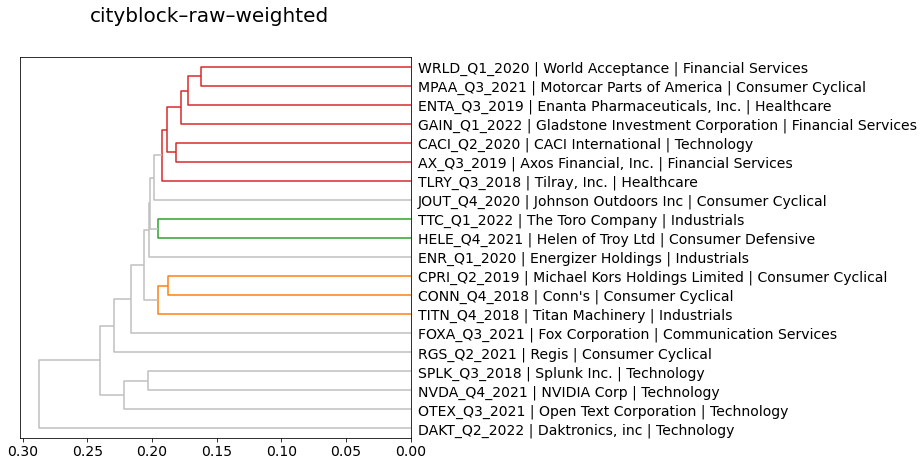

In [140]:
linkages=["weighted","ward","ward","weighted","weighted"]
m=combos[0][-1]
l=linkages[0]
title = f"{m}–{l}"
hca(PAIRS.iloc[:,1], title, linkage_method=l)

<Figure size 432x288 with 0 Axes>

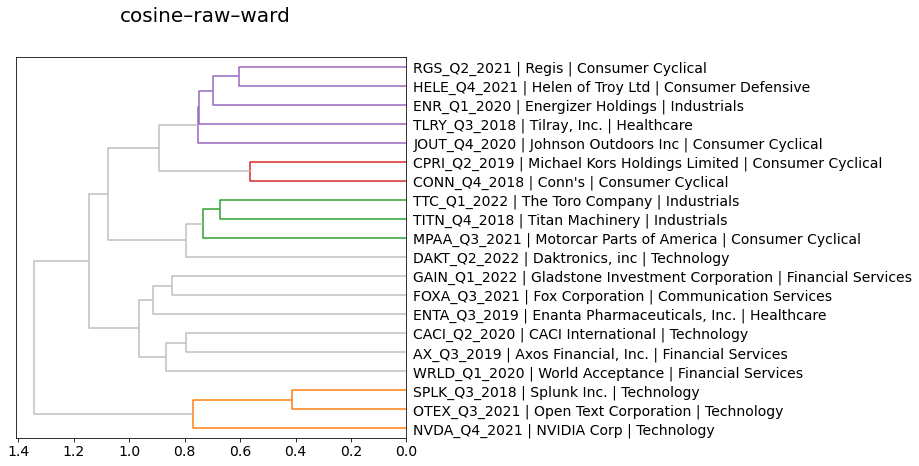

In [141]:
linkages=["weighted","ward","ward","weighted","weighted"]
m=combos[1][-1]
l=linkages[1]
title = f"{m}–{l}"
hca(PAIRS.iloc[:,2], title, linkage_method=l)

<Figure size 432x288 with 0 Axes>

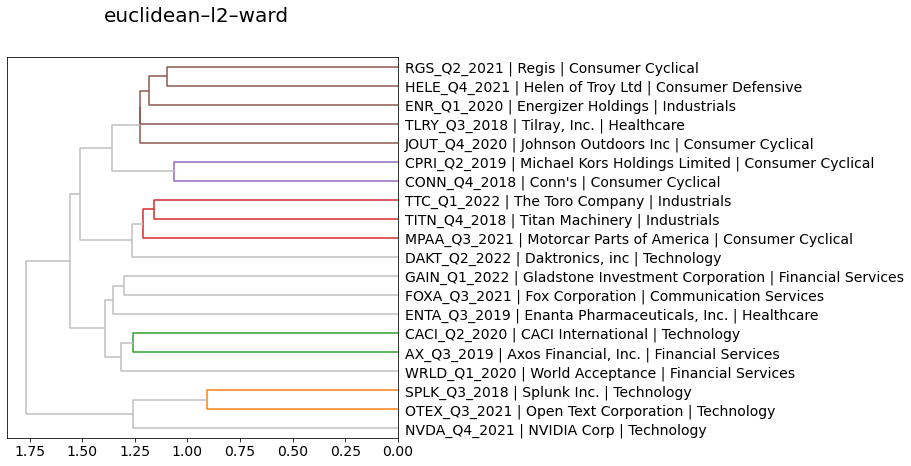

In [142]:
linkages=["weighted","ward","ward","weighted","weighted"]
m=combos[2][-1]
l=linkages[2]
title = f"{m}–{l}"
hca(PAIRS.iloc[:,3], title, linkage_method=l)

<Figure size 432x288 with 0 Axes>

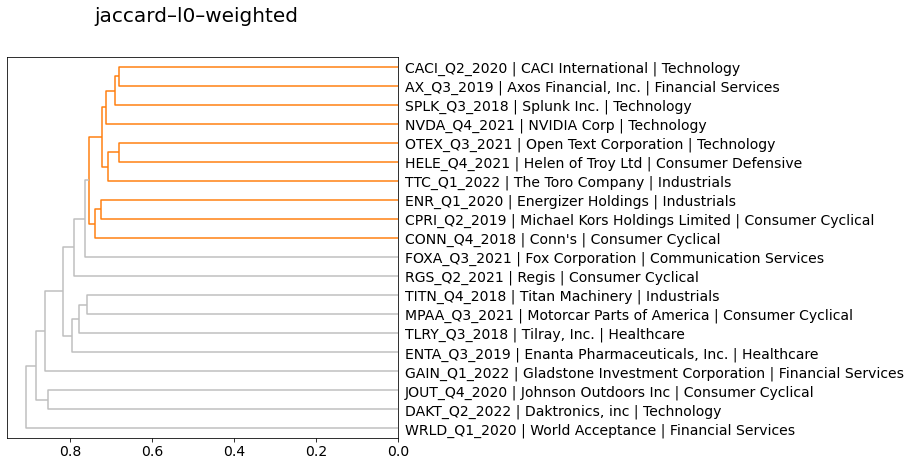

In [143]:
linkages=["weighted","ward","ward","weighted","weighted"]
m=combos[3][-1]
l=linkages[3]
title = f"{m}–{l}"
hca(PAIRS.iloc[:,4], title, linkage_method=l)

<Figure size 432x288 with 0 Axes>

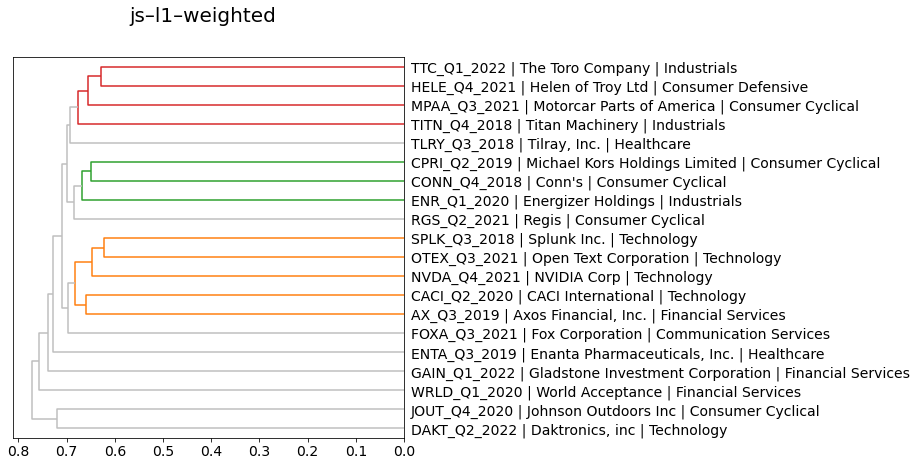

In [144]:
linkages=["weighted","ward","ward","weighted","weighted"]
m=combos[4][-1]
l=linkages[4]
title = f"{m}–{l}"
hca(PAIRS.iloc[:,5], title, linkage_method=l)

# VII. Principal Components Analysis (PCA)

In [199]:
## Input hyperparameters

norm_docs = True # L2 norming
center_by_mean = True # This has the effect of demoting authorship when False
center_by_variance = False # Not supposed to ... Exaggerates significance of rare words
k = 6 # Number of components
n_terms=len(keep_words)

In [200]:
## Filter TFIDF using ALL docs, but only 1000 most significant workds

TFIDF_keep=TFIDF_calls[keep_words]
TFIDF_mean=TFIDF_keep.groupby("earnings_id").mean()
TFIDF_mean=TFIDF_mean.fillna(0) # imputed 0 for NA values
#TFIDF_mean

TFIDF_mean

term_str,post,capability,reflected,accelerating,types,traditional,created,role,leveraging,deals,...,wish,wait,independent,teens,flat,exit,opposed,rolling,hear,identify
earnings_id,,,,,,,,,,,,,,,,,,,,,
AAPL_Q1_2018,0.0,0.000000,0.000000,0.000508,0.000170,0.000168,0.000339,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000500,0.00000,0.000264,0.000264,0.000100,0.00000
AAPL_Q1_2019,0.0,0.000000,0.000000,0.000175,0.000175,0.000000,0.000000,0.000351,0.000000,0.000174,...,0.000000,0.000273,0.000000,0.000000,0.000103,0.00000,0.000000,0.000273,0.000103,0.00000
AAPL_Q1_2020,0.0,0.000175,0.000348,0.000175,0.000175,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000207,0.00000,0.000000,0.000000,0.000309,0.00000
AAPL_Q1_2021,0.0,0.000000,0.000000,0.000161,0.000161,0.000000,0.000000,0.000484,0.000000,0.000000,...,0.000251,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000664,0.00000
AAPL_Q1_2022,0.0,0.000173,0.000172,0.000000,0.000173,0.000000,0.000173,0.000347,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00027,0.000270,0.000000,0.000510,0.00027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUO_Q3_2021,0.0,0.000453,0.000000,0.000227,0.000000,0.000000,0.000000,0.000000,0.000000,0.002704,...,0.000000,0.000000,0.000000,0.000000,0.000134,0.00000,0.000000,0.000000,0.000267,0.00000
ZUO_Q3_2022,0.0,0.000000,0.000000,0.000187,0.000373,0.000186,0.000000,0.000000,0.000000,0.002964,...,0.000000,0.000000,0.000000,0.000000,0.000110,0.00000,0.000000,0.000000,0.000110,0.00000
ZUO_Q4_2020,0.0,0.000000,0.000000,0.000237,0.000000,0.000236,0.000000,0.001189,0.000000,0.000471,...,0.000739,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000280,0.00000


In [201]:
## Perform adjustements to TFIDF based on input hyperparameters

if norm_docs:
    TFIDF_mean = TFIDF_mean.apply(lambda x: x / np.linalg.norm(x), 1)
    
if center_by_mean:
    TFIDF_mean = TFIDF_mean - TFIDF_mean.mean()
    
if center_by_variance:
    TFIDF_mean = TFIDF_mean / TFIDF_mean.std()
    

In [202]:
## Covariance

COV = TFIDF_mean.cov()
COV

term_str,post,capability,reflected,accelerating,types,traditional,created,role,leveraging,deals,...,wish,wait,independent,teens,flat,exit,opposed,rolling,hear,identify
term_str,,,,,,,,,,,,,,,,,,,,,
post,4.189521e-04,-0.000017,-0.000003,9.567502e-06,-0.000006,-8.092679e-06,7.814620e-06,0.000011,3.975480e-06,-7.941684e-07,...,0.000007,0.000015,0.000008,8.612644e-06,-0.000005,-3.417889e-06,6.338805e-06,9.479789e-06,0.000002,3.491942e-07
capability,-1.660881e-05,0.000656,-0.000006,1.945858e-05,0.000032,4.311690e-06,1.034887e-05,0.000017,3.977119e-05,6.677088e-05,...,-0.000002,-0.000013,-0.000041,2.470503e-05,-0.000021,-5.496554e-06,-1.159784e-05,9.422899e-06,0.000008,2.228663e-05
reflected,-3.050698e-06,-0.000006,0.000332,1.041869e-06,-0.000013,1.120581e-05,8.644929e-06,0.000014,4.343908e-06,-3.860578e-05,...,0.000004,-0.000009,-0.000025,-9.418670e-06,-0.000001,2.283054e-06,1.364403e-05,-5.615753e-06,-0.000012,-2.035108e-06
accelerating,9.567502e-06,0.000019,0.000001,3.356114e-04,0.000003,1.794742e-06,8.562124e-06,0.000014,3.852290e-05,2.104549e-05,...,-0.000011,-0.000007,-0.000009,4.498546e-05,-0.000005,-3.858668e-07,-1.156790e-05,1.109703e-05,0.000015,-6.113868e-06
types,-6.225600e-06,0.000032,-0.000013,2.530948e-06,0.000414,1.164908e-05,5.496860e-06,0.000016,-8.991256e-06,3.202695e-05,...,-0.000006,0.000005,0.000003,-6.677921e-06,-0.000003,5.698019e-06,2.203303e-05,-6.401119e-06,0.000018,1.088233e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
exit,-3.417889e-06,-0.000005,0.000002,-3.858668e-07,0.000006,-1.849839e-05,3.197376e-06,0.000006,-9.818055e-06,2.161321e-07,...,-0.000005,-0.000013,0.000027,2.167323e-05,0.000009,6.245549e-04,5.279948e-07,-9.682826e-06,0.000003,-8.366832e-06
opposed,6.338805e-06,-0.000012,0.000014,-1.156790e-05,0.000022,1.194336e-05,1.773694e-06,-0.000005,-1.068713e-05,2.752967e-05,...,0.000009,0.000005,0.000004,-1.427535e-05,0.000006,5.279948e-07,2.861207e-04,-1.700195e-07,0.000007,1.682701e-06
rolling,9.479789e-06,0.000009,-0.000006,1.109703e-05,-0.000006,8.461061e-06,-1.994749e-06,0.000001,1.005402e-05,-2.030028e-05,...,0.000009,0.000007,0.000003,-8.888933e-06,0.000011,-9.682826e-06,-1.700195e-07,3.775333e-04,0.000009,1.698284e-06


In [203]:
from scipy.linalg import eigh
%time eig_vals, eig_vecs = eigh(COV)
eig_vecs.shape

CPU times: user 667 ms, sys: 387 ms, total: 1.05 s
Wall time: 471 ms


(1000, 1000)

In [204]:
## Decompose into eigenvectors

EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
EIG_VAL.index.name = 'term_str'
#EIG_VEC.iloc[:10, :10].style.background_gradient(cmap='GnBu', high=.5)
EIG_IDX = EIG_VAL.eig_val.sort_values(ascending=False).head(k) #.index
COMPS = EIG_VEC[EIG_IDX.index].T # EIG_VEC.T.loc[EIG_IDX]
COMPS.index = [i for i in range(COMPS.shape[0])]
COMPS.index.name = 'pc_id'
LOADINGS = COMPS.T

In [206]:
LOADINGS.head(20).style.background_gradient(cmap='GnBu', high=.5)

pc_id,0,1,2,3,4,5
term_str,,,,,,
post,-0.005658,-0.001431,-0.016380,-0.015829,0.011498,0.007613
capability,0.016817,-0.004775,-0.002510,-0.009547,-0.030164,0.004857
reflected,-0.004979,-0.007493,-0.006364,0.002202,0.001805,0.002911
accelerating,0.006787,0.012586,-0.007454,-0.010632,-0.009850,-0.006538
types,0.005787,-0.015931,0.003518,-0.010329,-0.005171,0.001653
traditional,0.010213,0.001663,-0.001698,-0.011408,-0.015163,0.011473
created,-0.001294,0.000360,-0.004450,0.002444,-0.004581,-0.004721
role,0.000467,0.002309,-0.004500,-0.011966,0.002486,0.006713
leveraging,-0.004142,0.010518,-0.009258,-0.010478,-0.017036,0.005268


In [207]:
## Component info table

COMPINF = pd.DataFrame(index=COMPS.index)
for i in range(k):
    for j in [0, 1]:
        top_terms = ' '.join(LOADINGS.sort_values(i, ascending=bool(j)).head(5).index.to_list())
        COMPINF.loc[i, j] = top_terms
COMPINF = COMPINF.rename(columns={0:'pos', 1:'neg'})
COMPINF

,pos,neg
pc_id,,
0,cloud security subscription software enterprise,stores brands store brand retail
1,cloud stores store brands brand,backlog projects production commercial equipment
2,stores store backlog comp commercial,brands brand consumers consumer category
3,cloud inflation backlog labor production,subscription bookings mobile retention content
4,equity subscription fees cloud asset,design mobile backlog security orders
5,security healthcare equity health mobile,subscription backlog bookings projects brands


In [208]:
## Document component matrix - projecting loadings onto documents through dot product

DCM = TFIDF_mean.dot(LOADINGS) 
DCM

pc_id,0,1,2,3,4,5
earnings_id,,,,,,
AAPL_Q1_2018,-0.091765,0.117217,0.081225,-0.113681,-0.065326,0.087125
AAPL_Q1_2019,-0.075005,0.169040,0.163297,-0.104371,0.004963,0.029850
AAPL_Q1_2020,-0.079096,0.183131,0.111213,-0.115673,-0.000019,0.018482
AAPL_Q1_2021,-0.101404,0.180232,0.153438,-0.095486,-0.026460,0.047820
AAPL_Q1_2022,-0.006096,0.032471,-0.000140,-0.095769,-0.044181,0.058507
...,...,...,...,...,...,...
ZUO_Q3_2021,0.210560,0.155572,-0.043680,-0.418323,0.134668,-0.357469
ZUO_Q3_2022,0.241801,0.114768,-0.004673,-0.335431,0.132534,-0.319908
ZUO_Q4_2020,0.211525,0.017735,0.015725,-0.390816,0.168283,-0.389148


In [210]:
## Check to make the index sizes are the same/all docs are captured

(DOCS.index != DCM.index).sum()
#DOCS[DOCS.sector.isna()==True].ticker.unique()

0

In [343]:
## Visualize

px.scatter(DCM, 0, 1, color=DOCS.sector, symbol=DOCS.year, 
           size=np.abs(DOCS.tfidf_sum),hover_name=DOCS.company_name, 
           marginal_x='box', marginal_y='box', height=1000)

In [213]:
COMPINF.loc[[0,1]]

,pos,neg
pc_id,,
0,cloud security subscription software enterprise,stores brands store brand retail
1,cloud stores store brands brand,backlog projects production commercial equipment


# VIII. Topic modeling

In [226]:
## Read in Dr. Alvarado's topic model wrapper code

from sklearn.decomposition import LatentDirichletAllocation as LDA, NMF
class TopicModel():            

    """
    A class to convert a BOW table into a topic model consisting of THETA, PHI, and TOPIC tables.
    Attributes:
        bow_count_col (str): The name of the token count column in the BOW table. Defaults to 'n'.
        n_term (int): The number of vocabalary terms to use in the topic model. Defaults to None.
        n_topics (int): The number of topics to generate. Defaults to 20.
        n_top_terms (int): The number of top terms to use to represent each topic. Will compute based on entropy if no value given. Defaults to None.
        engine_type (str): The topic modeling engine to use. May be 'LDA' or 'NMF'. Defaults to 'LDA'.
        alpha (float) = The document-topic prior, e.g. .1.  Defaults to None.
        beta (float) = The topic-term prior, e.g. .01.  Defaults to None.
        
        # LDA Params
        max_iter:int = 20
        learning_offset:float = 50.
        random_state:int = 0
        
        # NMF Params
        nmf_init:str = 'nndsvd'
        nmf_max_iter:int = 1000
        nmf_random_state:int = 1
        kw = {} # Extra parameters
    """

    # General
    bow_count_col:str = 'n'
    n_terms:int = None
    n_topics:int = 20
    n_top_terms:int = None
    engine_type:str = 'LDA' # Also NMF
    alpha:float = None # doc_topic_prior
    beta:float = None  # topic_word_prior
    
    # LDA Params
    max_iter:int = 20
    learning_offset:float = 50.
    random_state:int = 0
    
    # NMF Params
    nmf_init:str = 'nndsvd'
    nmf_max_iter:int = 1000
    nmf_random_state:int = 1

    kw = {} # Extra parameters
    
    def __init__(self, BOW:pd.DataFrame):
        """
        Initialize by passing a bag-of-words table with an OHCO index and 'n' feature of word counts.
        """
        self.BOW = BOW
        
    def create_X(self):
        
        # Convert BOW to DTM (X)
        X = self.BOW[self.bow_count_col].unstack(fill_value=0)

        # Reduce feature space if asked
        V = X[X > 0].sum().to_frame('df')
        if self.n_terms:
            V['idf'] = np.log2(len(X)/V.df)
            V['dfidf'] = V.df * V.idf
            SIGS = V.sort_values('dfidf', ascending=False).head(self.n_terms).index
            self.X = X[SIGS]
        else:
            self.X = X
        self.V = V        
        
    def get_model(self):
        
        if self.engine_type == 'LDA':
            self.engine = LDA(n_components=self.n_topics, 
                                max_iter=self.max_iter, 
                                doc_topic_prior=self.alpha,
                                topic_word_prior=self.beta,
                                learning_offset=self.learning_offset, 
                                random_state=self.random_state,
                                **self.kw)

        elif self.engine_type == 'NMF':
            self.engine = NMF(n_components=self.n_topics, 
                                max_iter=self.nmf_max_iter,
                                init=self.nmf_init, 
                                random_state=self.nmf_random_state, 
                                **self.kw)
                
        self.THETA = pd.DataFrame(self.engine.fit_transform(self.X.values), index=self.X.index)
        self.THETA.columns.name = 'topic_id'
        
        self.PHI = pd.DataFrame(self.engine.components_, columns=self.X.columns)
        self.PHI.index.name = 'topic_id'
        self.PHI.columns.name = 'term_str'
        
        self.TOPIC = self.PHI.sum(1).to_frame('phi_sum')
        self.TOPIC['theta_sum'] = self.THETA.sum()

    def describe_topics(self):
        
        # Compute topic entropy over PHI to get n for top terms
        PHI_P = (self.PHI.T / self.PHI.T.sum())
        PHI_I = np.log2(1/PHI_P)
        self.TOPIC['h'] = round((PHI_I * PHI_P).sum().sort_values(ascending=False), 2)
        if not self.n_top_terms:
            self.n_top_terms = round(self.TOPIC.h.mean())

        # Compute relevant terms
        self.get_relevant_terms(0)
        
        # Get top terms
        self.TOPIC['top_terms'] = self.PHI.apply(lambda x: ' '.join(x.sort_values(ascending=False).head(self.n_top_terms).index), 1)        
        self.TOPIC['label'] = self.TOPIC.apply(lambda x: f"{x.name}: {x.top_terms_rel}", 1)
        

    def get_relevant_terms(self, 𝜆 = .5):
        """
        Compute relevance of topic terms as defined by Sievert and Shirley 2014.
        C. Sievert and K. Shirley, “LDAvis: A Method for Visualizing and Interpreting Topics,” 
        in Proceedings of the workshop on interactive language learning, visualization, and interfaces, 2014, pp. 63–70.
        """
        Ptw = self.PHI.apply(lambda x: x / x.sum(), 1) # L1 norm of PHI rows, i.e. p(w|t)
        Pw = self.PHI.sum() / self.PHI.sum().sum() # Marginal probs of terms in PHI, i.e. p(w)
        self.REL = 𝜆 * np.log2(Ptw) + (1-𝜆) * np.log2(Ptw / Pw)
        self.TOPIC['top_terms_rel'] = self.REL.apply(lambda x: ' '.join(x.sort_values(ascending=False).head(self.n_top_terms).index), 1)

    def get_model_stats(self):
        self.entropy = self.TOPIC.h.sum()
        self.redundancy = 1 - self.entropy / np.log2(self.n_topics)
    
    def get_doc_stats(self):
        self.DOC = (self.THETA.T * np.log2(1/self.THETA.T)).sum().to_frame('entropy')
        self.DOC['max_topic'] = self.THETA.idxmax(1)
        
    def plot_topics(self):
        self.TOPIC.sort_values('theta_sum', ascending=True)\
            .plot.barh(y='theta_sum', x='label', figsize=(5, self.n_topics/2))

In [221]:
## Create topic model objects

n_topics=40
n_terms=2000

In [222]:
tm=TopicModel(BOW_calls)

In [223]:
tm.n_topics=n_topics
tm.n_terms=n_terms

In [224]:
tm.create_X()

In [227]:
tm.get_model()

In [228]:
tm.describe_topics()

In [229]:
tm.get_model_stats()

In [231]:
tm.THETA.sum().sort_values(ascending=False)
tm.TOPIC.iloc[20]

phi_sum                                                     239320
theta_sum                                                  400.683
h                                                               10
top_terms_rel    coronavirus remotely essential virus shut unce...
top_terms        disruption restrictions temporary essential fa...
label            20: coronavirus remotely essential virus shut ...
Name: 20, dtype: object

In [747]:
## Combine topic distributions with LIB features

attributes=list(LIB.columns)
combined=pd.merge(LIB.reset_index()[["earnings_id","year"]],tm.THETA,on="earnings_id")
combined

,earnings_id,year,0,1,2,3,4,5,6,7,...,30,31,32,33,34,35,36,37,38,39
0,AAPL_Q1_2018,2018,0.000030,0.000030,0.000030,0.000030,0.000030,0.000030,0.000030,0.062677,...,0.000030,0.000030,0.010368,0.000030,0.032045,0.000030,0.000030,0.000030,0.000030,0.160854
1,AAPL_Q1_2019,2019,0.000031,0.000031,0.000031,0.000031,0.000031,0.000031,0.000031,0.029971,...,0.038326,0.000031,0.000031,0.000031,0.018797,0.000031,0.000031,0.000031,0.000031,0.193300
2,AAPL_Q1_2020,2020,0.000035,0.000035,0.000035,0.000035,0.000035,0.011307,0.000035,0.000035,...,0.057883,0.000035,0.000035,0.000035,0.000035,0.000035,0.024093,0.000035,0.000035,0.000035
3,AAPL_Q1_2021,2021,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,...,0.065046,0.000038,0.018879,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038
4,AAPL_Q1_2022,2022,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,...,0.097478,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4210,ZUO_Q3_2021,2021,0.000053,0.000053,0.000053,0.000053,0.000053,0.000053,0.000053,0.000053,...,0.060474,0.000053,0.000053,0.079981,0.000053,0.000053,0.000053,0.000053,0.000053,0.000053
4211,ZUO_Q3_2022,2022,0.000048,0.000048,0.000048,0.000048,0.000048,0.000048,0.000048,0.000048,...,0.000048,0.000048,0.000048,0.075618,0.000048,0.000048,0.000048,0.000048,0.027376,0.000048
4212,ZUO_Q4_2020,2020,0.000058,0.000058,0.000058,0.000058,0.000058,0.000058,0.000058,0.000058,...,0.000058,0.000058,0.000058,0.000058,0.000058,0.000058,0.004740,0.000058,0.000058,0.007737
4213,ZUO_Q4_2021,2021,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,...,0.000054,0.031991,0.000054,0.095604,0.000054,0.000054,0.000054,0.055976,0.000054,0.000054


In [748]:
combined_agg=combined.set_index("earnings_id")
combined_agg.head()

,year,0,1,2,3,4,5,6,7,8,...,30,31,32,33,34,35,36,37,38,39
earnings_id,,,,,,,,,,,,,,,,,,,,,
AAPL_Q1_2018,2018,0.000030,0.000030,0.000030,0.000030,0.000030,0.000030,0.000030,0.062677,0.000030,...,0.000030,0.000030,0.010368,0.000030,0.032045,0.000030,0.000030,0.000030,0.000030,0.160854
AAPL_Q1_2019,2019,0.000031,0.000031,0.000031,0.000031,0.000031,0.000031,0.000031,0.029971,0.000031,...,0.038326,0.000031,0.000031,0.000031,0.018797,0.000031,0.000031,0.000031,0.000031,0.193300
AAPL_Q1_2020,2020,0.000035,0.000035,0.000035,0.000035,0.000035,0.011307,0.000035,0.000035,0.000035,...,0.057883,0.000035,0.000035,0.000035,0.000035,0.000035,0.024093,0.000035,0.000035,0.000035
AAPL_Q1_2021,2021,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,...,0.065046,0.000038,0.018879,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038,0.000038
AAPL_Q1_2022,2022,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,...,0.097478,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039,0.000039


In [749]:
## See topic distributions by year

combined_agg=combined.groupby("year").mean()
combined_agg.style.background_gradient(cmap='GnBu',axis=None)
#TOPIC_YEAR=combined_agg.copy()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018,0.010896,0.022482,0.007743,0.015822,0.017445,0.028521,0.015292,0.016959,0.009542,0.032294,0.025317,0.056645,0.022882,0.027081,0.021861,0.015336,0.031694,0.022754,0.033510,0.014091,0.014677,0.021238,0.013614,0.005753,0.054139,0.016496,0.017221,0.014035,0.011352,0.016168,0.026580,0.022132,0.008222,0.009222,0.003243,0.021409,0.013507,0.031174,0.020529,0.211122
2019,0.015323,0.017880,0.016295,0.017634,0.011267,0.034209,0.013476,0.023445,0.005429,0.022849,0.042211,0.064008,0.019966,0.035046,0.030059,0.014099,0.033059,0.016658,0.035485,0.015477,0.031365,0.016033,0.016849,0.010287,0.064009,0.019718,0.012269,0.029024,0.014274,0.017569,0.019909,0.025028,0.008837,0.009662,0.007926,0.018966,0.012034,0.049184,0.020180,0.113000
2020,0.015931,0.024092,0.013391,0.016133,0.011269,0.033501,0.013919,0.019475,0.006329,0.020353,0.045068,0.071146,0.014457,0.032930,0.029963,0.009985,0.031647,0.017203,0.035655,0.012981,0.146840,0.017814,0.017900,0.006639,0.053760,0.019222,0.011920,0.030312,0.020130,0.013895,0.024596,0.025280,0.008606,0.008446,0.008969,0.019818,0.017048,0.042533,0.019939,0.010906
2021,0.018542,0.021398,0.011283,0.014103,0.010149,0.033861,0.012625,0.025683,0.005158,0.019431,0.042385,0.074828,0.014379,0.031189,0.033911,0.008922,0.029780,0.022053,0.036666,0.012118,0.118274,0.015348,0.017461,0.006096,0.068234,0.020974,0.010482,0.024133,0.021516,0.012639,0.033571,0.027759,0.010145,0.008631,0.009483,0.022812,0.018782,0.049794,0.021448,0.003956
2022,0.013961,0.025794,0.010349,0.012154,0.010223,0.029451,0.014363,0.030723,0.005265,0.014598,0.035510,0.118296,0.011052,0.026597,0.037841,0.007439,0.029578,0.022815,0.031842,0.009162,0.082493,0.016890,0.015924,0.006208,0.073452,0.019330,0.012377,0.031807,0.021910,0.009118,0.036173,0.018676,0.011506,0.010649,0.008564,0.021785,0.015905,0.061815,0.024878,0.003527


In [757]:
combined_agg.iloc[:,20:].style.background_gradient(cmap='GnBu',axis=None)

,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
year,,,,,,,,,,,,,,,,,,,,
2018,0.014677,0.021238,0.013614,0.005753,0.054139,0.016496,0.017221,0.014035,0.011352,0.016168,0.026580,0.022132,0.008222,0.009222,0.003243,0.021409,0.013507,0.031174,0.020529,0.211122
2019,0.031365,0.016033,0.016849,0.010287,0.064009,0.019718,0.012269,0.029024,0.014274,0.017569,0.019909,0.025028,0.008837,0.009662,0.007926,0.018966,0.012034,0.049184,0.020180,0.113000
2020,0.146840,0.017814,0.017900,0.006639,0.053760,0.019222,0.011920,0.030312,0.020130,0.013895,0.024596,0.025280,0.008606,0.008446,0.008969,0.019818,0.017048,0.042533,0.019939,0.010906
2021,0.118274,0.015348,0.017461,0.006096,0.068234,0.020974,0.010482,0.024133,0.021516,0.012639,0.033571,0.027759,0.010145,0.008631,0.009483,0.022812,0.018782,0.049794,0.021448,0.003956
2022,0.082493,0.016890,0.015924,0.006208,0.073452,0.019330,0.012377,0.031807,0.021910,0.009118,0.036173,0.018676,0.011506,0.010649,0.008564,0.021785,0.015905,0.061815,0.024878,0.003527


In [346]:
tm.TOPIC.iloc[20]

phi_sum                                                     239320
theta_sum                                                  400.683
h                                                               10
top_terms_rel    coronavirus remotely essential virus shut unce...
top_terms        disruption restrictions temporary essential fa...
label            20: coronavirus remotely essential virus shut ...
Name: 20, dtype: object

In [557]:
## See topic distributions by sector

combined=pd.merge(LIB.reset_index()[["earnings_id","sector"]],tm.THETA,on="earnings_id")
combined_agg=combined.set_index("earnings_id")
combined_agg=combined.groupby("sector").mean()
combined_agg.style.background_gradient(cmap='GnBu',axis=None)
#TOPIC_SECTOR=combined_agg.copy()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
sector,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Basic Materials,0.002833,0.003964,0.011205,0.000960,0.027108,0.005882,0.007677,0.001967,0.003022,0.012649,0.090972,0.003303,0.011379,0.000238,0.000787,0.010548,0.011255,0.011903,0.065815,0.000046,0.100867,0.055994,0.009673,0.003414,0.251142,0.007687,0.009590,0.010441,0.019330,0.000515,0.004902,0.026703,0.001748,0.073186,0.000295,0.001789,0.001007,0.014974,0.000681,0.122549
Communication Services,0.003676,0.003895,0.004301,0.001676,0.002428,0.001403,0.001067,0.001205,0.002286,0.017865,0.007018,0.009029,0.006121,0.013967,0.036636,0.003444,0.003418,0.445541,0.012664,0.006654,0.081485,0.009820,0.000959,0.051152,0.003423,0.045305,0.002537,0.002498,0.021900,0.003774,0.018195,0.004831,0.039372,0.000306,0.003013,0.000617,0.052915,0.022071,0.011681,0.039852
Consumer Cyclical,0.051042,0.090301,0.002905,0.024404,0.005050,0.001585,0.004757,0.010376,0.004501,0.004025,0.011569,0.003916,0.002841,0.001789,0.004606,0.006731,0.006619,0.024462,0.015261,0.010810,0.099573,0.004422,0.017440,0.000962,0.073099,0.023530,0.032837,0.122716,0.033024,0.003024,0.095144,0.073516,0.028759,0.003694,0.003047,0.005131,0.023712,0.019682,0.004464,0.044676
Consumer Defensive,0.056312,0.017485,0.000883,0.055941,0.028554,0.007965,0.000885,0.001171,0.000152,0.001610,0.008602,0.001582,0.003255,0.000733,0.004314,0.000361,0.003310,0.002582,0.270396,0.001399,0.090410,0.042034,0.023470,0.000400,0.110948,0.000821,0.014038,0.010903,0.061750,0.017766,0.020155,0.005214,0.006375,0.007151,0.000915,0.000836,0.045102,0.019626,0.003634,0.050959
Energy,0.000067,0.006734,0.011336,0.012737,0.005956,0.001197,0.000182,0.000067,0.000067,0.009080,0.550013,0.001402,0.000955,0.002086,0.002468,0.001374,0.006537,0.002115,0.002107,0.000853,0.097554,0.099990,0.007692,0.000067,0.021552,0.000328,0.005777,0.003375,0.010633,0.002449,0.001495,0.008805,0.004526,0.000311,0.000513,0.000295,0.000597,0.066444,0.011131,0.039134
Financial Services,0.002913,0.005669,0.000923,0.008524,0.002305,0.005139,0.003212,0.001293,0.001796,0.280840,0.009049,0.004857,0.072301,0.000624,0.005834,0.001079,0.003194,0.001292,0.003675,0.054526,0.084460,0.002608,0.000550,0.000100,0.003781,0.004451,0.001377,0.000388,0.048324,0.000199,0.008018,0.028957,0.002916,0.000557,0.001877,0.000261,0.001822,0.307347,0.000580,0.032382
Healthcare,0.001742,0.004258,0.000965,0.001650,0.005241,0.251351,0.016365,0.007809,0.001353,0.003861,0.083515,0.030945,0.004756,0.004584,0.014624,0.010409,0.014323,0.002906,0.018679,0.006179,0.093626,0.006725,0.087925,0.001385,0.043230,0.034418,0.003459,0.015019,0.010940,0.036278,0.020665,0.005848,0.001317,0.016962,0.001696,0.002853,0.004336,0.060074,0.024365,0.043361
Industrials,0.005141,0.027227,0.005480,0.027324,0.028389,0.004836,0.053421,0.013859,0.000650,0.003308,0.062260,0.005380,0.020790,0.013429,0.015177,0.006798,0.111940,0.001364,0.007367,0.008093,0.138084,0.040046,0.000877,0.002433,0.150731,0.037531,0.008881,0.017235,0.005323,0.003506,0.009885,0.039898,0.001813,0.003238,0.019340,0.003964,0.015174,0.032718,0.001525,0.045565
No Information Available,0.002664,0.006665,0.002567,0.002125,0.003990,0.009579,0.002136,0.006268,0.001138,0.034588,0.004221,0.152403,0.006302,0.000850,0.055403,0.000767,0.015822,0.003379,0.028129,0.069408,0.087169,0.007785,0.000885,0.003627,0.035140,0.016580,0.002178,0.012884,0.014937,0.001592,0.045464,0.040066,0.003620,0.069245,0.041707,0.004276,0.116785,0.042691,0.002814,0.042153


In [760]:
tm.TOPIC.iloc[37]

phi_sum                                                     106626
theta_sum                                                  202.971
h                                                             9.79
top_terms_rel    coupa ryan stephanie yield fee singh valuation...
top_terms        ryan fee yield joseph coupa weighted fund attr...
label            37: coupa ryan stephanie yield fee singh valua...
Name: 37, dtype: object

In [560]:
## See topic distributions by company

combined=pd.merge(LIB.reset_index()[["earnings_id","ticker"]],tm.THETA,on="earnings_id")
combined_agg=combined.set_index("earnings_id")
combined_agg=combined.groupby("ticker").mean()
combined_agg.style.background_gradient(cmap='GnBu',axis=None)
#TOPIC_TICKER=combined_agg.copy()

In [258]:
tm.TOPIC.iloc[15]

phi_sum                                                    26047.3
theta_sum                                                  44.2538
h                                                             8.58
top_terms_rel    larry iphone randy apple baker pete apples jus...
top_terms        larry apple pete randy iphone baker alan divis...
label            15: larry iphone randy apple baker pete apples...
Name: 15, dtype: object

In [259]:
## See topic distributions by quarter

combined=pd.merge(LIB[["earnings_id","quarter"]],tm.THETA,on="earnings_id")
combined_agg=combined.set_index("earnings_id")
combined_agg=combined.groupby("quarter").mean()
combined_agg.style.background_gradient(cmap='GnBu',axis=None)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
quarter,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.017011,0.020458,0.012058,0.015642,0.012003,0.033584,0.013840,0.025600,0.006023,0.019607,0.042821,0.069804,0.016927,0.030440,0.030960,0.010028,0.031131,0.020053,0.039626,0.014407,0.089323,0.016222,0.017254,0.007181,0.068605,0.020415,0.012740,0.027209,0.018312,0.014859,0.027211,0.024084,0.009120,0.009415,0.007976,0.020999,0.016086,0.049054,0.020289,0.041626
2,0.016837,0.022492,0.013937,0.016151,0.011132,0.032647,0.013844,0.024853,0.006562,0.022736,0.038379,0.078730,0.012186,0.032663,0.032200,0.009272,0.031986,0.019946,0.034468,0.011499,0.090078,0.017192,0.015911,0.007814,0.061067,0.020145,0.010889,0.029503,0.019800,0.012432,0.028758,0.024316,0.010146,0.010234,0.008530,0.019565,0.017994,0.046651,0.021545,0.044909
3,0.013819,0.025196,0.012865,0.015507,0.011737,0.031832,0.012251,0.020887,0.005109,0.020309,0.038209,0.083541,0.016115,0.032170,0.031507,0.011728,0.031972,0.019385,0.033074,0.011171,0.101602,0.016830,0.017745,0.006418,0.057489,0.018931,0.012259,0.027818,0.019667,0.013559,0.026553,0.024341,0.009028,0.008517,0.008721,0.020398,0.015436,0.046097,0.023499,0.046705
4,0.015737,0.020804,0.010784,0.013355,0.010134,0.032744,0.014570,0.023248,0.005845,0.019719,0.043133,0.076941,0.017365,0.030206,0.032391,0.011020,0.029091,0.020002,0.033237,0.013677,0.099605,0.017216,0.016753,0.006803,0.065453,0.019015,0.012336,0.024223,0.018134,0.013805,0.030737,0.025931,0.009848,0.008402,0.008387,0.022941,0.014873,0.050815,0.019750,0.040970


In [262]:
tm.TOPIC.iloc[20]

phi_sum                                                     239320
theta_sum                                                  400.683
h                                                               10
top_terms_rel    coronavirus remotely essential virus shut unce...
top_terms        disruption restrictions temporary essential fa...
label            20: coronavirus remotely essential virus shut ...
Name: 20, dtype: object

# IX. Word2vec

In [263]:
w2v_params = dict(
    min_count = 10,
    workers = 4,
    # vector_size = 246,
    vector_size = 100,
    window = 2    
)

In [264]:
tsne_params = dict(
    learning_rate = 200., #'auto' or [10.0, 1000.0]
    perplexity = 40,
    n_components = 2,
    init = 'random',
    n_iter = 1000,
    random_state = 23    
)

In [289]:
VOCAB_2018['pos_group'] = VOCAB_2018.max_pos.str.slice(0,2)
VOCAB_2019['pos_group'] = VOCAB_2019.max_pos.str.slice(0,2)
VOCAB_2020['pos_group'] = VOCAB_2020.max_pos.str.slice(0,2)
VOCAB_2021['pos_group'] = VOCAB_2021.max_pos.str.slice(0,2)
VOCAB_2022['pos_group'] = VOCAB_2022.max_pos.str.slice(0,2)
VOCAB['pos_group'] = VOCAB.max_pos.str.slice(0,2)

In [275]:
## List of token lists

SENTS = CORPUS.groupby(OHCO[:-1]).term_str.apply(lambda  x:  x.tolist())

In [283]:
model = word2vec.Word2Vec(SENTS.values, **w2v_params)

In [284]:
W2V = pd.DataFrame(model.wv.get_normed_vectors(), index=model.wv.index_to_key)
W2V.index.name = 'term_str'
W2V = W2V.sort_index()

In [286]:
## Visualize using tsne

tsne_engine = TSNE(**tsne_params)
tsne_model = tsne_engine.fit_transform(W2V)

In [290]:
COORDS = pd.DataFrame(tsne_model, columns=['x','y'], index=W2V.index)\
    .join(VOCAB, how='left')[['x','y','n','dfidf','pos_group']]

In [292]:
px.scatter(COORDS.reset_index().sample(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

In [293]:
px.scatter(COORDS.reset_index().sort_values('dfidf', ascending=False).head(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

In [294]:
## Semantic algebra functions by Dr. Alvarado

def complete_analogy(A, B, C, n=2):
    try:
        cols = ['term', 'sim']
        return pd.DataFrame(model.wv.most_similar(positive=[B, C], negative=[A])[0:n], columns=cols)
    except KeyError as e:
        print('Error:', e)
        return None
    
def get_most_similar(positive, negative=None):
    return pd.DataFrame(model.wv.most_similar(positive, negative), columns=['term', 'sim'])

In [324]:
complete_analogy('failure', 'success', 'bankruptcy', 5)

,term,sim
0,acquisition.,0.561407
1,successes,0.544834
2,momentum,0.543594
3,progress,0.519286
4,traction,0.507783


In [325]:
complete_analogy('good', 'value', 'bad', 5)

,term,sim
0,discount,0.535209
1,tco,0.520595
2,roi,0.508550
3,returns,0.500808
4,friction,0.496711


In [743]:
get_most_similar('roi')

,term,sim
0,rois,0.704270
1,probability,0.640158
2,density,0.624855
3,fidelity,0.620428
4,value,0.599930
5,potency,0.588990
6,returns,0.579794
7,engagement,0.575345
8,tco,0.567277
9,quality,0.560635


In [742]:
get_most_similar('traditional')

,term,sim
0,conventional,0.751314
1,legacy,0.661780
2,linear,0.627369
3,classic,0.596240
4,core,0.574681
5,newer,0.572428
6,older,0.557378
7,uc,0.555218
8,dense,0.554896
9,typical,0.553011


In [318]:
get_most_similar('losses')

,term,sim
0,loss,0.744541
1,gains,0.677836
2,recoveries,0.651070
3,proceeds,0.639790
4,impairments,0.625694
5,charges,0.621574
6,allowances,0.601692
7,expenses,0.597071
8,profits,0.584732
9,liabilities,0.580533


In [321]:
get_most_similar('growth')

,term,sim
0,growth.,0.696129
1,improvement,0.649379
2,decline,0.629875
3,expansion,0.624335
4,declines,0.620712
5,recovery,0.608692
6,outperformance,0.595217
7,performance,0.590237
8,conversion,0.581882
9,retention,0.577830


In [335]:
get_most_similar('wacc')

,term,sim
0,11.00,0.817758
1,knee,0.732555
2,comfortably,0.560683
3,1:1,0.520051
4,2.80,0.510353
5,"61,000",0.509664
6,isto,0.497723
7,2.70,0.494621
8,expectations.,0.494490
9,threes,0.492533


# X. Sentiment analysis

In [394]:
## Download NRC lexicon

SALEX=pd.read_csv("salex_nrc.csv")
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]
SALEX.tail(20)

,term_str,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
3668,wound,1,0,0,1,0,1,0,1,0,0,-1
3669,wrangling,1,0,1,1,0,1,0,1,0,0,-1
3670,wrath,1,0,0,1,0,1,0,0,0,0,-1
3671,wreak,1,0,0,0,0,1,0,0,0,0,-1
3672,wreck,1,0,1,1,0,1,0,1,1,0,-1
3673,wrecked,1,0,0,1,0,1,0,1,0,0,-1
3674,wretch,1,0,1,0,0,1,0,1,0,0,-1
3675,wretched,0,0,1,0,0,1,0,1,0,0,-1
3676,wrongdoing,1,0,1,0,0,1,0,1,0,0,-1
3677,wrongful,1,0,1,0,0,1,0,1,0,0,-1


In [374]:
SALEX=SALEX.set_index("term_str")

In [369]:
LIB=LIB.set_index("earnings_id")
LIB.head()

,ticker,company_name,quarter,year,earnings_text,source,call_length,sector,quarter_count,label
earnings_id,,,,,,,,,,
AAPL_Q1_2018,AAPL,"Apple, Inc.",1,2018,"[At this time, for opening remarks and introdu...",https://www.fool.com/earnings/call-transcripts...,8536,Technology,1,"AAPL_Q1_2018 | Apple, Inc. | Technology"
AAPL_Q1_2019,AAPL,"Apple, Inc.",1,2019,[Nancy Paxton Senior Director of Investor Rel...,https://www.fool.com/earnings/call-transcripts...,8262,Technology,5,"AAPL_Q1_2019 | Apple, Inc. | Technology"
AAPL_Q1_2020,AAPL,Apple Inc.,1,2020,"[Tejas Gala Senior Analyst, Corporate Finance...",https://www.fool.com/earnings/call-transcripts...,8264,Technology,9,AAPL_Q1_2020 | Apple Inc. | Technology
AAPL_Q1_2021,AAPL,Apple,1,2021,[Tejas Gala Director of Investor Relations an...,https://www.fool.com/earnings/call-transcripts...,8985,Technology,13,AAPL_Q1_2021 | Apple | Technology
AAPL_Q1_2022,AAPL,Apple,1,2022,"[Tejas Gala Director, Investor Relations, and...",https://www.fool.com/earnings/call-transcripts...,8362,Technology,17,AAPL_Q1_2022 | Apple | Technology


In [366]:
OHCO[:3]

['earnings_id', 'section_num', 'sent_num']

In [370]:
COMBO = CORPUS.join(LIB)

In [372]:
COMBO.drop(["earnings_text","source","call_length"],axis=1,inplace=True)
COMBO

pos_tuple  pos  \
earnings_id  section_num sent_num token_num                                
AAPL_Q1_2018 0           0        1                    ('At', 'IN')   IN   
                                  2                  ('this', 'DT')   DT   
                                  3                  ('time', 'NN')   NN   
                                  5                   ('for', 'IN')   IN   
                                  6              ('opening', 'VBG')  VBG   
...                                                             ...  ...   
ZUO_Q4_2022  1           236      73             ('analysis', 'NN')   NN   
                                  75                  ('All', 'DT')   DT   
                                  76            ('earnings', 'NNS')  NNS   
                                  77                 ('call', 'NN')   NN   
                                  78         ('transcripts', 'NNS')  NNS   

                                               token_str     term_str ticker  \
earnings_id  section_num sent_num token_num                                    
AAPL_Q1_2018 0           0        1                   At           at   AAPL   
                                  2                 this         this   AAPL   
                                  3                 time         time   AAPL   
                                  5                  for          for   AAPL   
                                  6              opening      opening   AAPL   
...                                                  ...          ...    ...   
ZUO_Q4_2022  1           236      73            analysis     analysis    ZUO   
                                  75                 All          all    ZUO   
                                  76            earnings     earnings    ZUO   
                                  77                call         call    ZUO   
                                  78         transcripts  transcripts    ZUO   

                                            company_name  quarter  year  \
earnings_id  section_num sent_num token_num                               
AAPL_Q1_2018 0           0        1          Apple, Inc.        1  2018   
                                  2          Apple, Inc.        1  2018   
                                  3          Apple, Inc.        1  2018   
                                  5          Apple, Inc.        1  2018   
                                  6          Apple, Inc.        1  2018   
...                                                  ...      ...   ...   
ZUO_Q4_2022  1           236      73               Zuora        4  2022   
                                  75               Zuora        4  2022   
                                  76               Zuora        4  2022   
                                  77               Zuora        4  2022   
                                  78               Zuora        4  2022   

                                                 sector  quarter_count  \
earnings_id  section_num sent_num token_num                              
AAPL_Q1_2018 0           0        1          Technology              1   
                                  2          Technology              1   
                                  3          Technology              1   
                                  5          Technology              1   
                                  6          Technology              1   
...                                                 ...            ...   
ZUO_Q4_2022  1           236      73         Technology             20   
                                  75         Technology             20   
                                  76         Technology             20   
                                  77         Technology             20   
                                  78         Technology             20   

                                                                               label  
ea

In [375]:
COMBO=COMBO.join(SALEX, on='term_str')
COMBO.head()

pos_tuple  pos  \
earnings_id  section_num sent_num token_num                            
AAPL_Q1_2018 0           0        1                ('At', 'IN')   IN   
                                  2              ('this', 'DT')   DT   
                                  3              ('time', 'NN')   NN   
                                  5               ('for', 'IN')   IN   
                                  6          ('opening', 'VBG')  VBG   

                                            token_str term_str ticker  \
earnings_id  section_num sent_num token_num                             
AAPL_Q1_2018 0           0        1                At       at   AAPL   
                                  2              this     this   AAPL   
                                  3              time     time   AAPL   
                                  5               for      for   AAPL   
                                  6           opening  opening   AAPL   

                                            company_name  quarter  year  \
earnings_id  section_num sent_num token_num                               
AAPL_Q1_2018 0           0        1          Apple, Inc.        1  2018   
                                  2          Apple, Inc.        1  2018   
                                  3          Apple, Inc.        1  2018   
                                  5          Apple, Inc.        1  2018   
                                  6          Apple, Inc.        1  2018   

                                                 sector  quarter_count  ...  \
earnings_id  section_num sent_num token_num                             ...   
AAPL_Q1_2018 0           0        1          Technology              1  ...   
                                  2          Technology              1  ...   
                                  3          Technology              1  ...   
                                  5          Technology              1  ...   
                                  6          Technology              1  ...   

                                            anticipation  disgust  fear  joy  \
earnings_id  section_num sent_num token_num                                    
AAPL_Q1_2018 0           0        1                  NaN      NaN   NaN  NaN   
                                  2                  NaN      NaN   NaN  NaN   
                                  3                  NaN      NaN   NaN  NaN   
                                  5                  NaN      NaN   NaN  NaN   
                                  6                  NaN      NaN   NaN  NaN   

                                             negative  positive  sadness  \
earnings_id  section_num sent_num token_num                                
AAPL_Q1_2018 0           0        1               NaN       NaN      NaN   
                                  2               NaN       NaN      NaN   
                                  3               NaN       NaN      NaN   
                                  5               NaN       NaN      NaN   
                                  6               NaN       NaN      NaN   

                                             surprise  trust  polarity  
earnings_id  section_num sent_num token_num                             
AAPL_Q1_2018 0           0        1               NaN    NaN       NaN  
                                  2               NaN    NaN       NaN  
                                  3               NaN    NaN       NaN  
                                  5               NaN    NaN       NaN  
                                  6               NaN    NaN       NaN  

[5 rows x 22 columns]

In [376]:
COMBO=COMBO.join(BOW_calls, on=["earnings_id"] + ['term_str'])

In [378]:
COMBO.drop("n",axis=1,inplace=True)

In [379]:
COMBO = COMBO.sort_index()

In [380]:
COMBO=COMBO.dropna()

In [385]:
## Group combo by earnings_id

emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()
SA_DOCS = COMBO.groupby(OHCO[:1])[emo_cols+['tfidf_sum']].mean().join(LIB.label)

In [391]:
SAMPLED_DOCS=SA_DOCS.loc[sampled_calls]

## Visualize sentiment breakdown for sampled documents

In [392]:
## Visualize sentiments by earning id of sampled calls

px.bar(SAMPLED_DOCS.reset_index().sort_values('polarity'), emo_cols, 'label', orientation='h', height=1000)

In [395]:
## Visualize sampled call polarity, alone

px.bar(SAMPLED_DOCS.reset_index().sort_values('polarity'), "polarity", 'label', orientation='h', height=1000)

## Visualize by-industry and by-company sentiment timelines

In [485]:
temp=LIB.reset_index()[["ticker","year","quarter","quarter_count","label","sector"]].set_index(["ticker","year","quarter","quarter_count"])
temp

label  \
ticker year quarter quarter_count                                            
AAPL   2018 1       1              AAPL_Q1_2018 | Apple, Inc. | Technology   
       2019 1       5              AAPL_Q1_2019 | Apple, Inc. | Technology   
       2020 1       9               AAPL_Q1_2020 | Apple Inc. | Technology   
       2021 1       13                   AAPL_Q1_2021 | Apple | Technology   
       2022 1       17                   AAPL_Q1_2022 | Apple | Technology   
...                                                                    ...   
ZUO    2021 3       15              ZUO_Q3_2021 | Zuora, Inc. | Technology   
       2022 3       19              ZUO_Q3_2022 | Zuora, Inc. | Technology   
       2020 4       12                ZUO_Q4_2020 | Zuora Inc | Technology   
       2021 4       16              ZUO_Q4_2021 | Zuora, Inc. | Technology   
       2022 4       20                    ZUO_Q4_2022 | Zuora | Technology   

                                       sector  
ticker year quarter quarter_count              
AAPL   2018 1       1              Technology  
       2019 1       5              Technology  
       2020 1       9              Technology  
       2021 1       13             Technology  
       2022 1       17             Technology  
...                                       ...  
ZUO    2021 3       15             Technology  
       2022 3       19             Technology  
       2020 4       12             Technology  
       2021 4       16             Technology  
       2022 4       20             Technology  

[4215 rows x 2 columns]

In [466]:
sampled_tickers=list(LIB.loc[sampled_calls].ticker.values)
sampled_tickers
COMBO.reset_index()[COMBO.reset_index().ticker.isin(sampled_tickers)]

,earnings_id,section_num,sent_num,token_num,pos_tuple,pos,token_str,term_str,ticker,company_name,...,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity,tfidf_sum
166926,AX_Q1_2019,0,1,0,"('Good', 'JJ')",JJ,Good,good,AX,Axos Financial,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.000002
166927,AX_Q1_2019,0,3,17,"('President', 'NNP')",NNP,President,president,AX,Axos Financial,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000425
166928,AX_Q1_2019,0,3,21,"('Officer', 'NNP')",NNP,Officer,officer,AX,Axos Financial,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000003
166929,AX_Q1_2019,0,3,29,"('President', 'NNP')",NNP,President,president,AX,Axos Financial,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000425
166930,AX_Q1_2019,0,3,33,"('Officer', 'NNP')",NNP,Officer,officer,AX,Axos Financial,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1887277,WRLD_Q4_2021,0,105,29,"('President', 'NNP')",NNP,President,president,WRLD,World Acceptance Corp (S.C.),...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.001104
1887278,WRLD_Q4_2021,0,105,35,"('Officer', 'NNP')",NNP,Officer,officer,WRLD,World Acceptance Corp (S.C.),...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000008
1887279,WRLD_Q4_2021,0,105,43,"('Analyst', 'NNP')",NNP,Analyst,analyst,WRLD,World Acceptance Corp (S.C.),...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.000095
1887280,WRLD_Q4_2021,0,105,45,"('John', 'NNP')",NNP,John,john,WRLD,World Acceptance Corp (S.C.),...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.013372


In [486]:
## See a couple of company polarities over time

SA_YEAR_DOCS=COMBO.reset_index().groupby(["ticker","year","quarter","quarter_count"])[emo_cols+['tfidf_sum']].mean().join(temp)
SAMPLED_YEAR_DOCS=COMBO.reset_index()[COMBO.reset_index().ticker.isin(sampled_tickers)].groupby(["ticker","year","quarter","quarter_count"])[emo_cols+['tfidf_sum']].mean().join(temp)
#SA_YEAR_DOCS=SA_YEAR_DOCS.join(LIB.label,on="ticker")
#SA_YEAR_DOCS.merge(temp, on="ticker",how="left")


In [488]:
SA_YEAR_DOCS=SA_YEAR_DOCS.reset_index().set_index("ticker")
SAMPLED_YEAR_DOCS=SAMPLED_YEAR_DOCS.reset_index().set_index("ticker")

<AxesSubplot:xlabel='quarter_count'>

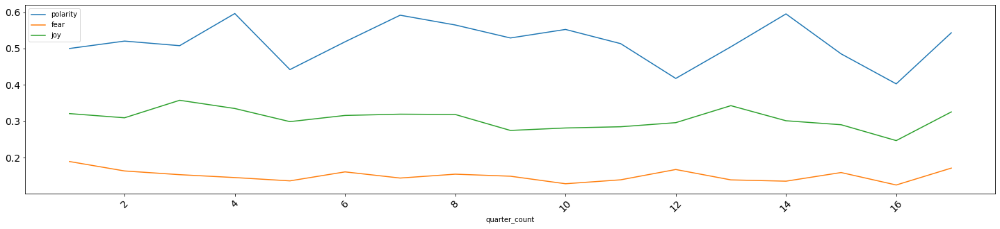

In [762]:
## Visualize Apple from full data set

FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
SA_YEAR_DOCS.loc['AAPL'][['polarity', 'fear','joy',"quarter_count"]].plot(**FIG,x="quarter_count")

In [515]:
INDUSTRIES=SAMPLED_YEAR_DOCS.groupby(["sector","year"])[emo_cols+['tfidf_sum']].mean()
INDUSTRIES

anger  anticipation   disgust      fear  \
sector                 year                                               
Communication Services 2018  0.098348      0.466334  0.107328  0.119839   
                       2019  0.121163      0.428110  0.051696  0.103393   
                       2020  0.128205      0.421911  0.062937  0.146853   
                       2021  0.083156      0.458950  0.038504  0.076923   
                       2022  0.100334      0.444816  0.053512  0.093645   
Consumer Cyclical      2018  0.092293      0.417143  0.063152  0.091257   
                       2019  0.092267      0.439537  0.071996  0.094628   
                       2020  0.126446      0.402894  0.083035  0.132040   
                       2021  0.137399      0.404971  0.066635  0.146100   
                       2022  0.110259      0.398314  0.067472  0.117458   
Consumer Defensive     2018  0.103215      0.428088  0.079526  0.140440   
                       2019  0.119787      0.383201  0.111920  0.116975   
                       2020  0.153696      0.393985  0.097132  0.125620   
                       2021  0.163448      0.424431  0.069371  0.137271   
                       2022  0.114700      0.410452  0.059643  0.127131   
Financial Services     2019  0.088401      0.420110  0.053700  0.097528   
                       2020  0.099994      0.397439  0.080609  0.105384   
                       2021  0.092596      0.417624  0.058527  0.083474   
                       2022  0.105605      0.411552  0.090956  0.106199   
Healthcare             2018  0.136507      0.404269  0.048869  0.209810   
                       2019  0.111750      0.441101  0.066832  0.153993   
                       2020  0.106440      0.438139  0.068525  0.201542   
                       2021  0.114849      0.412673  0.060906  0.164739   
                       2022  0.112332      0.470235  0.057112  0.189605   
Industrials            2018  0.158642      0.402358  0.061527  0.131905   
                       2019  0.122574      0.402070  0.065416  0.097693   
                       2020  0.116785      0.359758  0.055715  0.101030   
                       2021  0.138258      0.378345  0.061462  0.108461   
                       2022  0.132720      0.400740  0.070257  0.082549   
Technology             2018  0.111229      0.388145  0.072767  0.121349   
                       2019  0.104391      0.385741  0.078888  0.111418   
                       2020  0.095922      0.388061  0.078490  0.117828   
                       2021  0.119975      0.380765  0.074691  0.150455   
                       2022  0.113195      0.395130  0.071954  0.127109   

                                  joy   sadness  surprise     trust  polarity  \
sector                 year                                                     
Communication Services 2018  0.332100  0.134654  0.116353  0.595618  0.432378   
                       2019  0.310178  0.108239  0.140549  0.696284  0.639742   
                       2020  0.319347  0.146853  0.137529  0.606061  0.512821   
                       2021  0.363085  0.096509  0.122512  0.690086  0.680736   
                       2022  0.367893  0.100334  0.120401  0.678930  0.682274   
Consumer Cyclical      2018  0.334495  0.175176  0.115951  0.575249  0.511012   
                       2019  0.295789  0.129008  0.120148  0.653728  0.587219   
                       2020  0.280175  0.154118  0.112591  0.630191  0.490907   
                       2021  0.292636  0.157726  0.121805  0.642523  0.486509   
                       2022  0.300067  0.136169  0.126718  0.644214  0.525354   
Consumer Defensive     2018  0.357022  0.243655  0.145516  0.548223  0.331641   
                       2019  0.319588  0.174272  0.122339  0.627928  0.441138   
                       2020  0.311309  0.177715  0.125271  0.555637  0.378448   
                       2021  0.346554  0.170696  0.150888  0.573410  0.407983   
                       2022  0.3628

<AxesSubplot:xlabel='quarter_count'>

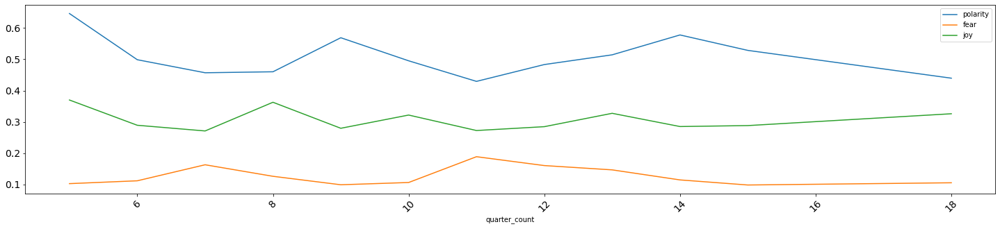

In [502]:
## Visualize AX from sample set

FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
SAMPLED_YEAR_DOCS.loc["AX"][['polarity',"quarter_count","fear","joy"]].plot(**FIG,x="quarter_count")

In [771]:
## Visualize fear by industry from sample set

fig = px.line(INDUSTRIES.reset_index()[['fear',"year","sector"]], x="year", y="fear", hover_name="sector", color='sector')
fig.show()

In [794]:
## Healthcare

temp=SALEX[["term_str","fear"]]
temp=temp[temp.fear==1]
temp.sample(20).T

,1909,912,3360,1839,1640,2506,716,781,347,1361,81,2797,1612,2385,3481,1917,3329,1671,2967,1586
term_str,intimately,derogatory,tribunal,infestation,hemorrhage,plea,court,curse,biopsy,flinch,aftermath,reticent,haunted,outburst,unthinkable,intrigue,torment,homicidal,shaking,hanging
fear,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


<AxesSubplot:xlabel='quarter_count', ylabel='fear'>

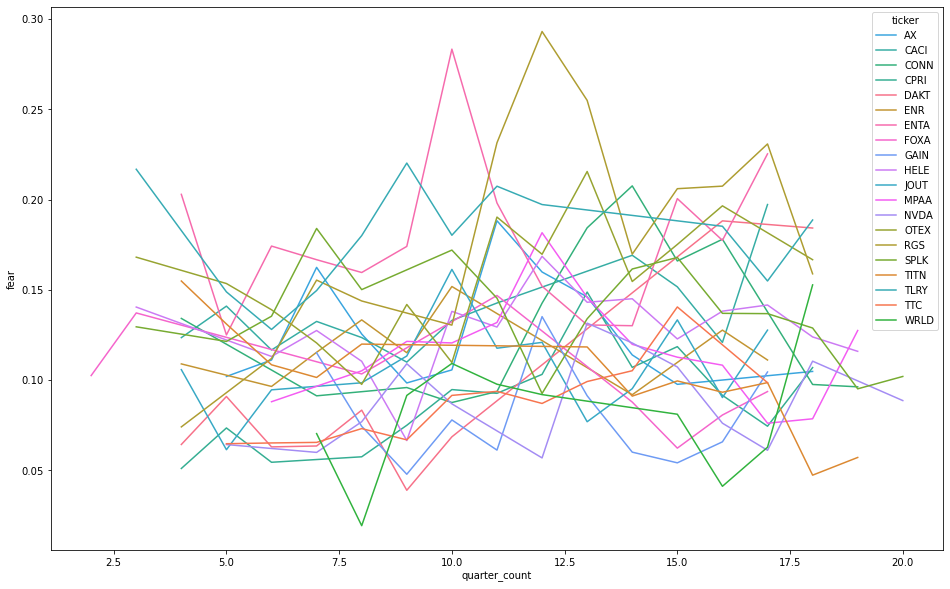

In [791]:
## Visualized polarity of all tickers

import seaborn as sns
colors = sns.color_palette('husl', n_colors=len(sampled_tickers))  # get a number of colors
cmap = dict(zip(sampled_tickers, colors))
plt.figure(figsize=(16, 10))
sns.lineplot(x='quarter_count', y='fear', hue='ticker', data=SAMPLED_YEAR_DOCS[['fear',"quarter_count","sector"]], palette=cmap)



In [703]:
len(LIB.sector.unique())

11

# XI. Export final data tables

In [ ]:
## Standard tables

# CORPUS.csv # set_index(["earning_id","section_num","sent_num","token_num"])
# LIB.csv # set_index("earnings_id")
# BOW.csv # set_index(["earnings_id","term_str"])
# VOCAB.csv # set_index("term_str")

## Sentiment analysis tables - COMBO, SA_YEAR_DOCS, SAMPLED_YEAR_DOCS, INDUSTRIES

# COMBO.csv # set_index(["earnings_id","section_num","sent_num","token_num"])
# SA_YEAR_DOCS.csv # set_index("ticker")
# SAMPLED_YEAR_DOCS.csv # set_index("ticker")
# INDUSTRIES.csv # set_index(["sector","year"])

## Word2vec/tsne table

# COORDS.csv #set_index("term_str")

## Topic Model tables

# TOPIC_YEAR.csv # set_index("year")
# TOPIC_SECTOR.csv # set_index("sector")
# TOPIC_TICKER.csv # set_index("ticker")

## PCA tables

# DCM.csv # set_index("earnings_id")
# DOCS # set_index("earnings_id")

## Clustering tables

# PAIRS.csv # set_index(["earning_a","earning_b"])

In [687]:
## Sentiment analysis table - COMBO, SA_YEAR_DOCS, SAMPLED_YEAR_DOCS, INDUSTRIES

COMBO.to_csv(path_or_buf = "final_project_COMBO.csv.gz",compression="gzip", index=True) # set_index(["earnings_id","section_num","sent_num","token_num"])


In [ ]:
COMBO.to_csv(path_or_buf = 'sample.csv.gz', compression="gzip",

In [689]:
SA_YEAR_DOCS.to_csv(path_or_buf = "final_project_SA_YEAR_DOCS.csv.gz",compression="gzip", index=True) #set_index("ticker")


In [690]:
SAMPLED_YEAR_DOCS.to_csv(path_or_buf = "final_project_SAMPLED_YEAR_DOCS.csv.gz",compression="gzip",index=True) #set_index("ticker")

In [691]:
INDUSTRIES.to_csv(path_or_buf ="final_project_INDUSTRIES.csv.gz",compression="gzip",index=True) #set_index(["sector","year"])


In [692]:
## Word2vec/tsne table

COORDS.to_csv(path_or_buf ="final_project_COORDS.csv.gz",compression="gzip",index=True) #set_index("term_str")

In [693]:
## Topic model table

TOPIC_YEAR.to_csv(path_or_buf ="final_project_TOPIC_YEAR.csv.gz",compression="gzip",index=True) #set_index("year")
TOPIC_SECTOR.to_csv(path_or_buf ="final_project_TOPIC_SECTOR.csv.gz",compression="gzip",index=True) #set_index("sector")
TOPIC_TICKER.to_csv(path_or_buf ="final_project_TOPIC_TICKER.csv.gz",compression="gzip",index=True) #set_index("ticker")

In [694]:
## PCA table

DCM.to_csv(path_or_buf ="final_project_DCM.csv.gz",compression="gzip",index=True) #set_index("earnings_id")
DOCS.to_csv(path_or_buf ="final_project_DOCS.csv.gz",compression="gzip",index=True) #set_index("earnings_id")

In [695]:
## Clustering

PAIRS.to_csv(path_or_buf ="final_project_PAIRS.csv.gz",compression="gzip",index=True) #set_index(["earning_a","earning_b"])

In [696]:
## Standard tables

BOW_calls.to_csv(path_or_buf ="final_project_BOW.csv.gz",compression="gzip",index=True) #set_index(["earnings_id","term_str"])

In [697]:
CORPUS.to_csv(path_or_buf ="final_project_CORPUS.csv.gz",compression="gzip", index=True) #set_index(["earning_id","section_num","sent_num","token_num"])

In [698]:
LIB.to_csv(path_or_buf ="final_project_LIB.csv.gz",compression="gzip", index=True) #set_index("earnings_id")
VOCAB.to_csv(path_or_buf ="final_project_VOCAB.csv.gz",compression="gzip",index=True) ##set_index("term_str")